In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import wordcloud

In [557]:
file_path = 'AMiner_Paper.csv'

# Read the CSV file into a DataFrame
author_df = pd.read_csv(file_path)

# Display basic information about the DataFrame
print(author_df.info())

# Display the first few rows of the DataFrame
print(author_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2092356 entries, 0 to 2092355
Data columns (total 8 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Unnamed: 0         int64  
 1   index              int64  
 2   Paper Title        object 
 3   Authors            object 
 4   Published Year     float64
 5   Publication Venue  object 
 6   Reference ID       float64
 7   Abstract           object 
dtypes: float64(2), int64(2), object(4)
memory usage: 127.7+ MB
None
   Unnamed: 0  index                                        Paper Title  \
0           0      1                        Book Review: Discover Linux   
1           1      2  MOSFET table look-up models for circuit simula...   
2           2      3  The verification of the protection mechanisms ...   
3           3      4  Another view of functional and multivalued dep...   
4           4      5     Entity-relationship diagrams which are in BCNF   

                                             Aut

In [4]:
# Check for missing values
print(author_df.isnull().sum())

Unnamed: 0                 0
index                      0
Paper Title               25
Authors                54752
Published Year           147
Publication Venue        139
Reference ID         1233562
Abstract              558370
dtype: int64


In [558]:
author_df = author_df.drop(columns=['Reference ID', 'Abstract'])

In [559]:
author_df['Authors'] = author_df['Authors'].fillna('Unknown')

In [560]:
# Example for numerical column (replace with mean)
author_df['Published Year'] = author_df['Published Year'].fillna(author_df['Published Year'].mean())

# Example for categorical column (replace with most frequent category)
author_df['Publication Venue'] = author_df['Publication Venue'].fillna(author_df['Publication Venue'].mode()[0])

In [8]:
# Check for missing values
print(author_df.isnull().sum())

Unnamed: 0            0
index                 0
Paper Title          25
Authors               0
Published Year        0
Publication Venue     0
dtype: int64


In [561]:
author_df = author_df.dropna()

In [10]:
# Check for missing values
print(author_df.isnull().sum())

Unnamed: 0           0
index                0
Paper Title          0
Authors              0
Published Year       0
Publication Venue    0
dtype: int64


In [524]:
author_df.to_csv("Academic.csv", index=False)

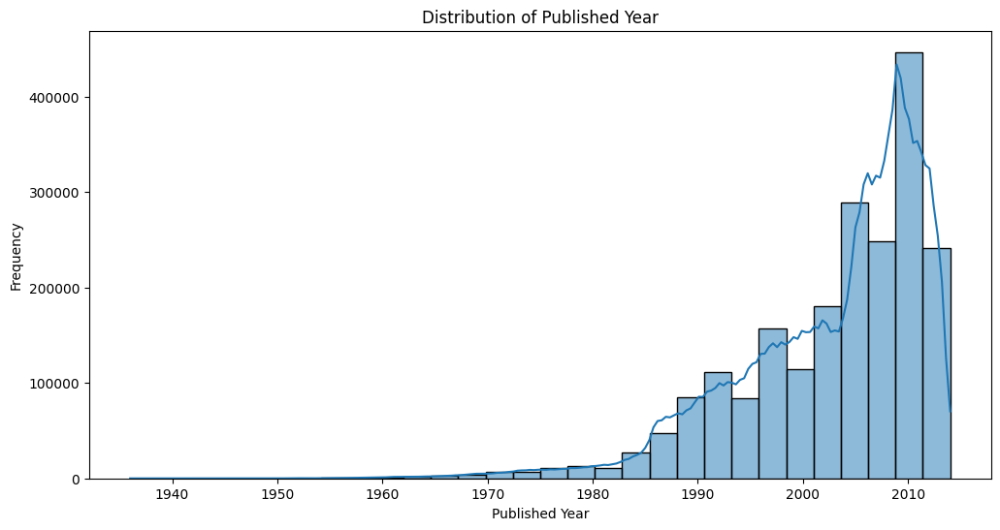

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/3606807751.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_authors.values, y=top_authors.index, palette='viridis')


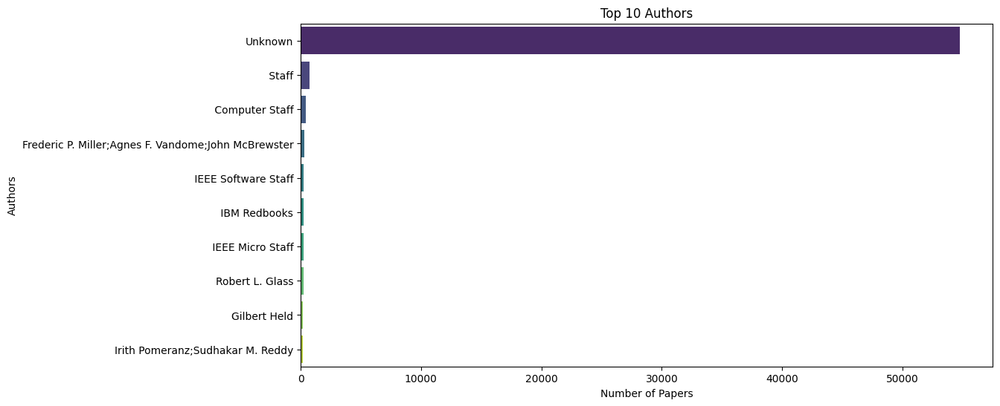

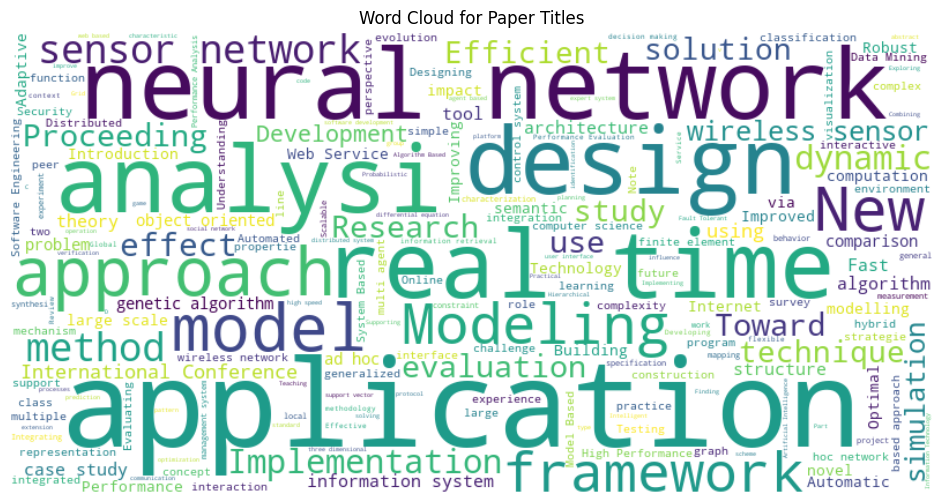

In [12]:
# Distribution of Published Year
plt.figure(figsize=(12, 6))
sns.histplot(author_df['Published Year'].dropna(), bins=30, kde=True)
plt.title('Distribution of Published Year')
plt.xlabel('Published Year')
plt.ylabel('Frequency')
plt.show()

# Top Authors
top_authors = author_df['Authors'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_authors.values, y=top_authors.index, palette='viridis')
plt.title('Top 10 Authors')
plt.xlabel('Number of Papers')
plt.ylabel('Authors')
plt.show()

# Word cloud for Paper Titles
from wordcloud import WordCloud

titles_text = ' '.join(author_df['Paper Title'].dropna())
wordcloud = WordCloud(width=800, height=400, random_state=42, background_color='white').generate(titles_text)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Paper Titles')
plt.axis('off')
plt.show()

In [562]:
author_df = author_df[author_df['Authors'] != 'Unknown']

In [563]:
sampled_data = author_df.sample(n=2000, random_state=42)

In [564]:
sampled_data.head(10)
sampled_data.to_csv("Sampled_Academic.csv", index=False)

In [565]:
sampled_data.head(10)

,Unnamed: 0,index,Paper Title,Authors,Published Year,Publication Venue
1388418,1388418,1388419,A preliminary study on multiple documents acce...,D. L. Chan;E. K. S. Ho;R. W. P. Luk;Q. Lu,2003.0,HSI'03 Proceedings of the 2nd international co...
170046,170046,170047,Principles of OLE 2.0 (videotape): an expositi...,Tony Williams,1994.0,Principles of OLE 2.0 (videotape): an expositi...
1316423,1316423,1316424,Temporal Semantics Extraction for Improving We...,María Teresa Vicente-Diez;Paloma Martinez,2009.0,DEXA '09 Proceedings of the 2009 20th Internat...
1667646,1667646,1667647,Shape analysis and fuzzy control for 3d compet...,Cybèle Ciofolo;Christian Barillot,2006.0,ECCV'06 Proceedings of the 9th European confer...
4105,4105,4106,The possible effect of abstracting guidelines ...,Raya Fidel,1986.0,Information Processing and Management: an Inte...
1621901,1621901,1621902,Interactive conditional proxy re-encryption wi...,Liming Fang;Willy Susilo;Chunpeng Ge;Jiandong ...,2011.0,Journal of Systems and Software
336027,336027,336028,Regular graphs with no homomorphisms onto cycles,I. M. Wanless;N. C. Wormald,2001.0,Journal of Combinatorial Theory Series B
648840,648840,648841,All-Electron Study of Gradient Corrections to ...,Alexander Khein;D. J. Singh;C. J. Umrigar,1994.0,All-Electron Study of Gradient Corrections to ...
1655725,1655725,1655726,Modelling coordination in biological systems,Dave Clarke;David Costa;Farhad Arbab,2004.0,ISoLA'04 Proceedings of the First internationa...
1341091,1341091,1341092,SCAM: scenario-based clustering algorithm for ...,V. S. Anitha;M. P. Sebastian,2009.0,COMSNETS'09 Proceedings of the First internati...


In [16]:
# Split the 'Authors' column into a list of authors
author_df['Authors'] = author_df['Authors'].str.split(';')

# Duplicate rows for each author
expanded_dat = author_df.explode('Authors').copy()

# Convert 'Published Year' to numeric (if not already)
expanded_dat['Published Year'] = pd.to_numeric(expanded_dat['Published Year'], errors='coerce')

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/1918019237.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  author_df['Authors'] = author_df['Authors'].str.split(';')


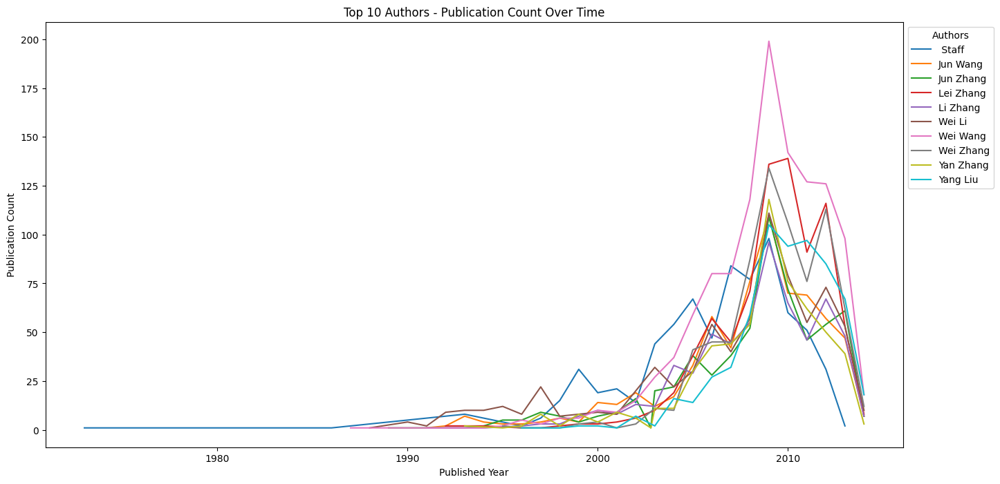

In [17]:
plt.figure(figsize=(16, 8))

# Group by Authors and Published Year, and count the number of papers
author_count_over_time = expanded_dat.groupby(['Authors', 'Published Year']).size().reset_index(name='Publication Count')

# Select the top 10 authors based on total publication count
top_authors = author_count_over_time.groupby('Authors')['Publication Count'].sum().sort_values(ascending=False).head(10).index

# Plot the trend analysis for the top 10 authors
sns.lineplot(x='Published Year', y='Publication Count', hue='Authors', data=author_count_over_time[author_count_over_time['Authors'].isin(top_authors)])
plt.title('Top 10 Authors - Publication Count Over Time')
plt.xlabel('Published Year')
plt.ylabel('Publication Count')
plt.legend(title='Authors', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

In [18]:
expanded_dat.head(10)

,Unnamed: 0,index,Paper Title,Authors,Published Year,Publication Venue
0,0,1,Book Review: Discover Linux,Marjorie Richardson,1998.0,Linux Journal
2,2,3,The verification of the protection mechanisms ...,Virgil D. Gligor,1984.0,International Journal of Parallel Programming
3,3,4,Another view of functional and multivalued dep...,M. Gyssens,1984.0,International Journal of Parallel Programming
3,3,4,Another view of functional and multivalued dep...,J. Paredaens,1984.0,International Journal of Parallel Programming
4,4,5,Entity-relationship diagrams which are in BCNF,Sushil Jajodia,1984.0,International Journal of Parallel Programming
4,4,5,Entity-relationship diagrams which are in BCNF,Peter A. Ng,1984.0,International Journal of Parallel Programming
4,4,5,Entity-relationship diagrams which are in BCNF,Frederick N. Springsteel,1984.0,International Journal of Parallel Programming
5,5,6,The computer comes of age,Rene Moreau,1984.0,The computer comes of age
6,6,7,Computationally efficient algorithms for a one...,A. G. Akritas,1984.0,International Journal of Parallel Programming
6,6,7,Computationally efficient algorithms for a one...,S. S. Lyengar,1984.0,International Journal of Parallel Programming


### Exploratory Data Analysis on the Final Clean Data

In [19]:
# Display basic information about the dataset
print(expanded_dat.info())

# Check for missing values
print(expanded_dat.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 5192872 entries, 0 to 2092355
Data columns (total 6 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Unnamed: 0         int64  
 1   index              int64  
 2   Paper Title        object 
 3   Authors            object 
 4   Published Year     float64
 5   Publication Venue  object 
dtypes: float64(1), int64(2), object(3)
memory usage: 277.3+ MB
None
Unnamed: 0           0
index                0
Paper Title          0
Authors              0
Published Year       0
Publication Venue    0
dtype: int64


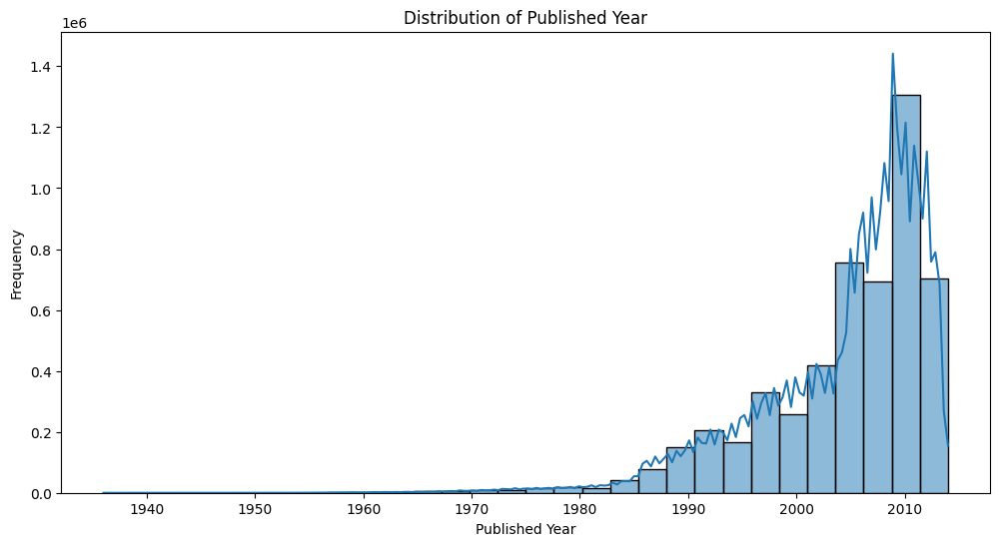

In [20]:
# Distribution of Published Year
plt.figure(figsize=(12, 6))
sns.histplot(expanded_dat['Published Year'].dropna(), bins=30, kde=True)
plt.title('Distribution of Published Year')
plt.xlabel('Published Year')
plt.ylabel('Frequency')
plt.show()

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/2738174997.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_authors.values, y=top_authors.index, palette='viridis')


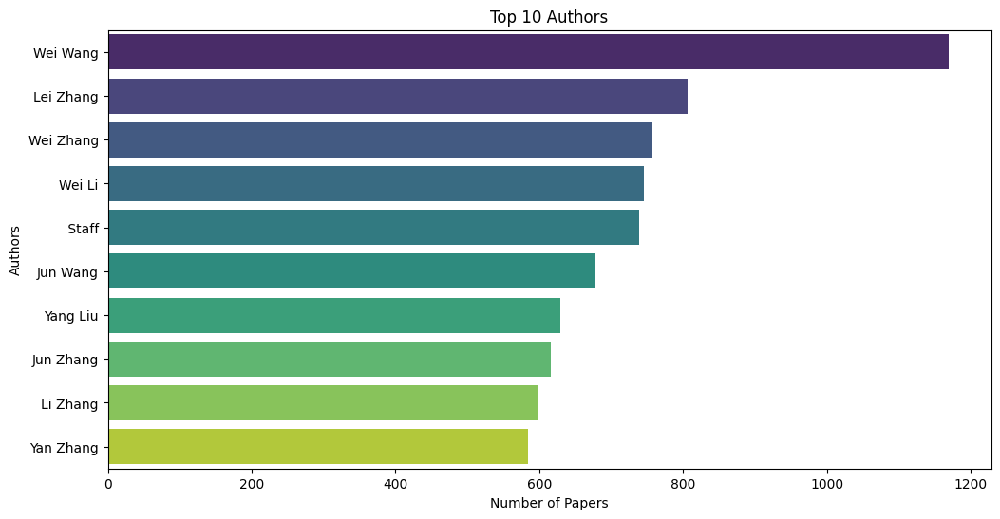

In [21]:
# Top Authors
top_authors = expanded_dat['Authors'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_authors.values, y=top_authors.index, palette='viridis')
plt.title('Top 10 Authors')
plt.xlabel('Number of Papers')
plt.ylabel('Authors')
plt.show()

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/1823491297.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_venues.values, y=top_venues.index, palette='viridis')


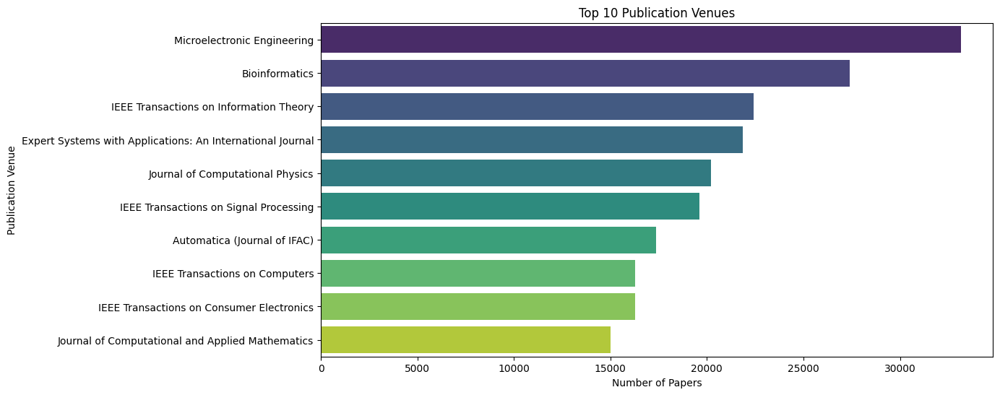

In [22]:
# Top Publication Venues
top_venues = expanded_dat['Publication Venue'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_venues.values, y=top_venues.index, palette='viridis')
plt.title('Top 10 Publication Venues')
plt.xlabel('Number of Papers')
plt.ylabel('Publication Venue')
plt.show()

In [24]:
import networkx as nx

# Create a graph from the collaboration data
G = nx.from_pandas_edgelist(expanded_dat, 'Authors', 'Paper Title')

# Calculate basic network metrics
print(f"Number of Nodes (Authors): {G.number_of_nodes()}")
print(f"Number of Edges (Collaborations): {G.number_of_edges()}")
print(f"Average Degree: {sum(dict(G.degree()).values()) / G.number_of_nodes():.2f}")


# Calculate degree centrality for each author (normalized degree)
degree_centrality = nx.degree_centrality(G)
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 authors by degree centrality
print("\nTop 10 Authors by Degree Centrality:")
for author, centrality in sorted_degree_centrality[:10]:
    print(f"{author}: {centrality:.4f}")

Number of Nodes (Authors): 3550645
Number of Edges (Collaborations): 5114632
Average Degree: 2.88

Top 10 Authors by Degree Centrality:
Wei Wang: 0.0003
Lei Zhang: 0.0002
Wei Zhang: 0.0002
Wei Li: 0.0002
Jun Wang: 0.0002
 Staff: 0.0002
Yang Liu: 0.0002
Jun Zhang: 0.0002
Li Zhang: 0.0002
Yan Zhang: 0.0002


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'sampled_dat' is your DataFrame containing the provided data
# If not, replace 'sampled_dat' with the actual variable name

# Convert 'Published Year' to numeric (if not already)
sampled_data['Published Year'] = pd.to_numeric(sampled_data['Published Year'], errors='coerce')

# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# Draw the collaboration network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Define a layout for the nodes
nx.draw(G, pos, with_labels=True, font_size=8, node_size=50, node_color='skyblue', edge_color='gray', alpha=0.7)
plt.title('Collaboration Network for Authors')
plt.show()

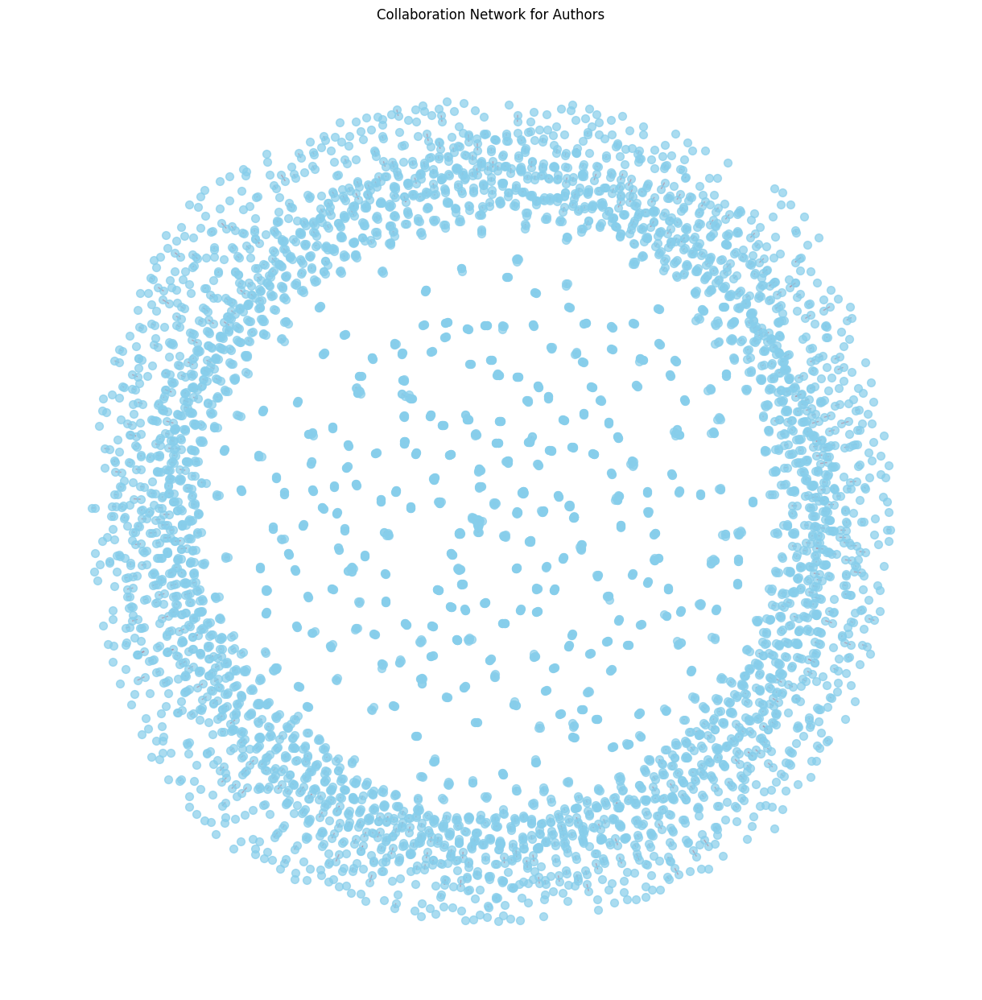

In [53]:
# Draw the collaboration network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Define a layout for the nodes
nx.draw(G, pos, with_labels=False, font_size=8, node_size=50, node_color='skyblue', edge_color='red', alpha=0.7)
plt.title('Collaboration Network for Authors')
plt.show()

In [54]:
# Calculate basic network metrics
print(f"Number of Nodes (Authors): {G.number_of_nodes()}")
print(f"Number of Edges (Collaborations): {G.number_of_edges()}")
print(f"Average Degree: {sum(dict(G.degree()).values()) / G.number_of_nodes():.2f}")


# Calculate degree centrality for each author (normalized degree)
degree_centrality = nx.degree_centrality(G)
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 authors by degree centrality
print("\nTop 10 Authors by Degree Centrality:")
for author, centrality in sorted_degree_centrality[:10]:
    print(f"{author}: {centrality:.4f}")

Number of Nodes (Authors): 5085
Number of Edges (Collaborations): 6268
Average Degree: 2.47

Top 10 Authors by Degree Centrality:
Geoff Coulson: 0.0031
Gordon Blair: 0.0031
Wei Li: 0.0030
Len Wosinska: 0.0026
Didier Colle: 0.0026
Piet Demeester: 0.0026
Kostas Katrinis: 0.0026
Marko Lackovic: 0.0026
Ozren Lapcevic: 0.0026
Ilse Lievens: 0.0026


In [65]:
# Compute collaboration and publication counts for each node
collaboration_counts = dict(G.degree())
publication_counts = sampled_data['Authors'].explode().value_counts().to_dict()

# Determine the node colors based on collaboration and publication counts
node_colors_collaboration = [collaboration_counts[node] for node in G.nodes()]
node_colors_publication = [publication_counts.get(node, 0) for node in G.nodes()]

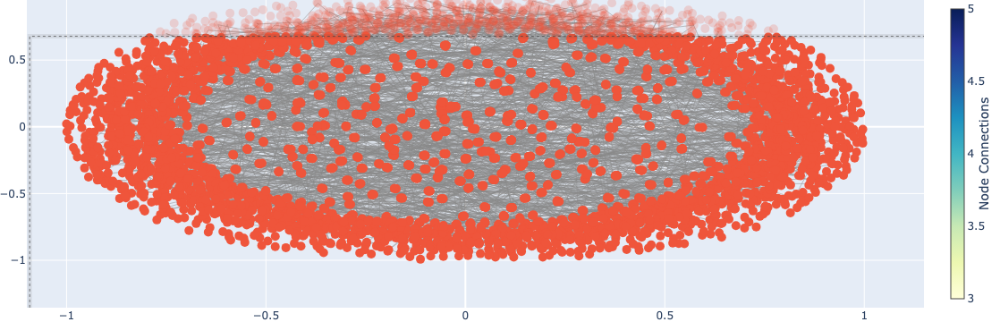

In [510]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

# Assuming 'Authors' column contains authors separated by ';'
# and 'Published Year' column is numeric

# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# Use the Fruchterman-Reingold layout for the force-directed graph
pos = nx.spring_layout(G)

# Create node and edge traces
node_trace = go.Scatter(
    x=[pos[node][0] for node in G.nodes()],
    y=[pos[node][1] for node in G.nodes()],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        )
    )
)

edge_trace = go.Scatter(
    x=[pos[edge[0]][0] for edge in G.edges()],
    y=[pos[edge[0]][1] for edge in G.edges()],
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines'
)

# Create the figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0)
                ))

# Show the figure
fig.show()

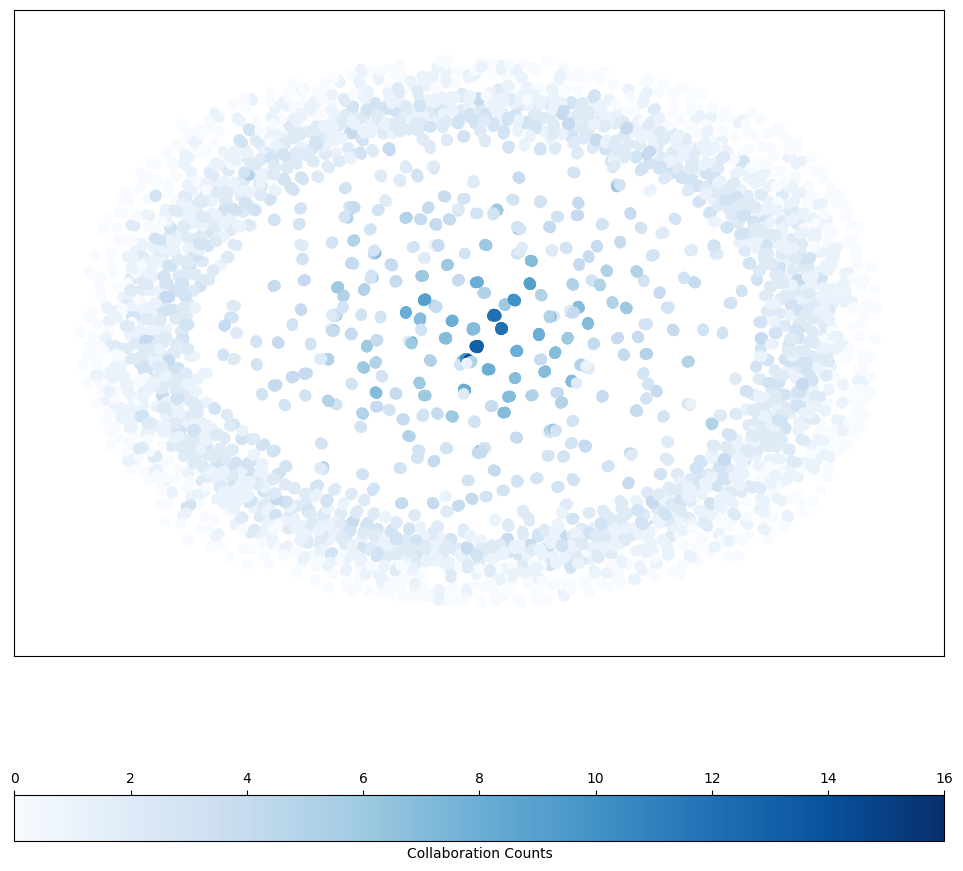

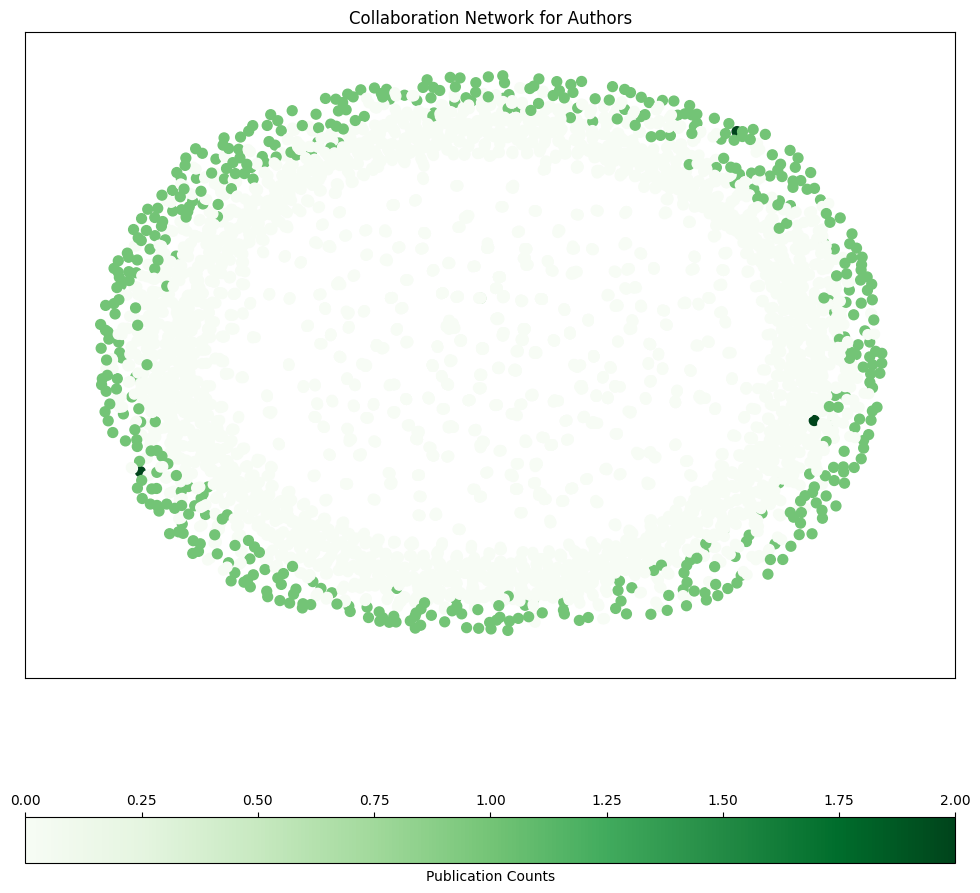

In [66]:
# Draw the collaboration network with colored nodes
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Define a layout for the nodes
nodes = nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.Blues, node_color=node_colors_collaboration)
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.7)

# Add colorbar for collaboration counts
cbar_collaboration = plt.colorbar(nodes, label='Collaboration Counts', orientation='horizontal')
cbar_collaboration.ax.xaxis.set_ticks_position('top')

# Draw the collaboration network with colored nodes based on publication counts
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Define a layout for the nodes
nodes = nx.draw_networkx_nodes(G, pos, node_size=50, cmap=plt.cm.Greens, node_color=node_colors_publication)
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.7)

# Add colorbar for publication counts
cbar_publication = plt.colorbar(nodes, label='Publication Counts', orientation='horizontal')
cbar_publication.ax.xaxis.set_ticks_position('top')

plt.title('Collaboration Network for Authors')
plt.show()

In [70]:
# Compute collaboration counts for each node
collaboration_counts = dict(G.degree())

# Identify the top N authors with the highest collaboration counts
top_authors = sorted(collaboration_counts, key=collaboration_counts.get, reverse=True)[:10]  # Change 10 to your desired number

# Extract the publication and collaboration data for the top authors
top_authors_data = sampled_data[sampled_data['Authors'].apply(lambda authors: any(author in top_authors for author in authors.split(';')))]

# Analyze publication patterns
publication_counts = top_authors_data['Authors'].explode().value_counts()

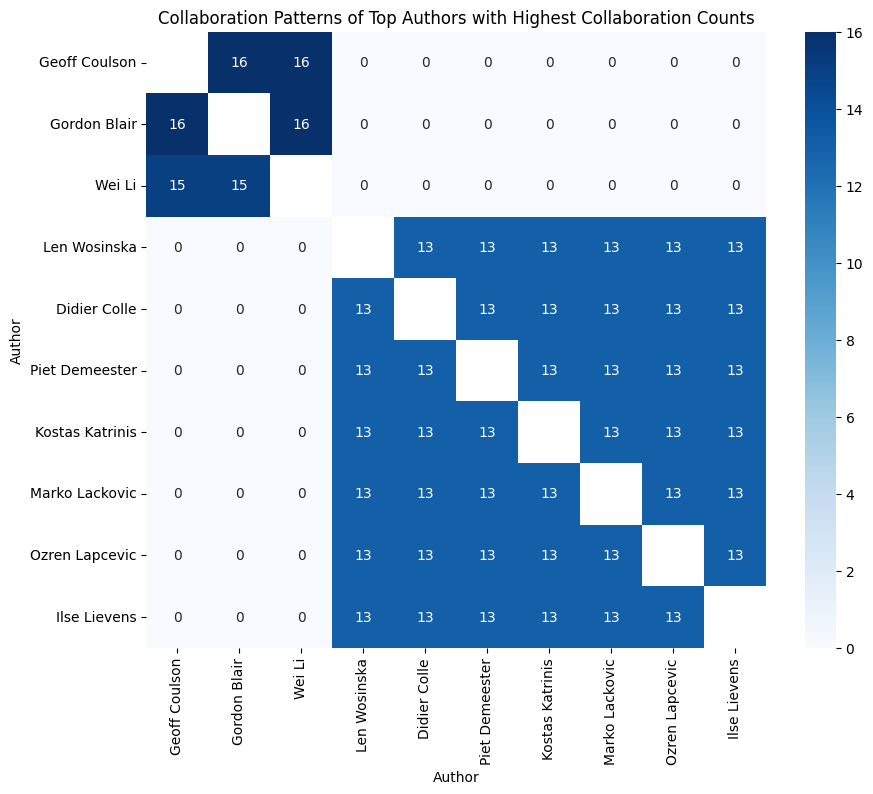

In [74]:
# Analyze collaboration patterns
collaboration_patterns = pd.DataFrame(index=top_authors, columns=top_authors, dtype=int)
for author1 in top_authors:
    for author2 in top_authors:
        if author1 != author2:
            collaboration_patterns.at[author1, author2] = G.degree[author1] if G.has_edge(author1, author2) else 0

# Visualize collaboration patterns
plt.figure(figsize=(10, 8))
sns.heatmap(collaboration_patterns, annot=True, cmap='Blues')
plt.title('Collaboration Patterns of Top Authors with Highest Collaboration Counts')
plt.xlabel('Author')
plt.ylabel('Author')
plt.show()

In [77]:
collaboration_patterns

,Geoff Coulson,Gordon Blair,Wei Li,Len Wosinska,Didier Colle,Piet Demeester,Kostas Katrinis,Marko Lackovic,Ozren Lapcevic,Ilse Lievens
Geoff Coulson,NaN,16.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Gordon Blair,16.0,NaN,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Wei Li,15.0,15.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Len Wosinska,0.0,0.0,0.0,NaN,13.0,13.0,13.0,13.0,13.0,13.0
Didier Colle,0.0,0.0,0.0,13.0,NaN,13.0,13.0,13.0,13.0,13.0
Piet Demeester,0.0,0.0,0.0,13.0,13.0,NaN,13.0,13.0,13.0,13.0
Kostas Katrinis,0.0,0.0,0.0,13.0,13.0,13.0,NaN,13.0,13.0,13.0
Marko Lackovic,0.0,0.0,0.0,13.0,13.0,13.0,13.0,NaN,13.0,13.0
Ozren Lapcevic,0.0,0.0,0.0,13.0,13.0,13.0,13.0,13.0,NaN,13.0
Ilse Lievens,0.0,0.0,0.0,13.0,13.0,13.0,13.0,13.0,13.0,NaN


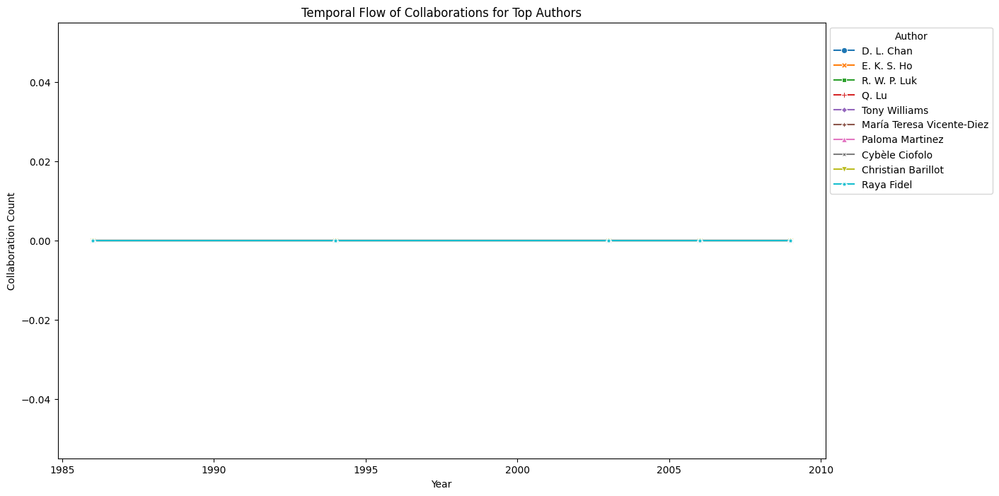

In [98]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'sampled_dat' is your DataFrame containing the provided data
# If not, replace 'sampled_dat' with the actual variable name

# Convert 'Published Year' to numeric (if not already)
sampled_data['Published Year'] = pd.to_numeric(sampled_data['Published Year'], errors='coerce')

# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2, {'year': row['Published Year']}) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# Identify the top N authors with the highest collaboration counts
top_authors = ['D. L. Chan', 'E. K. S. Ho', 'R. W. P. Luk', 'Q. Lu', 'Tony Williams', 'María Teresa Vicente-Diez', 'Paloma Martinez', 'Cybèle Ciofolo', 'Christian Barillot', 'Raya Fidel']

# Extract the collaboration data for the top authors
top_authors_data = sampled_data[sampled_data['Authors'].apply(lambda authors: any(author in top_authors for author in authors.split(';')))]

# Create a list of years for the temporal analysis
years = sorted(top_authors_data['Published Year'].dropna().astype(int).unique())

# Initialize a DataFrame to store collaboration counts over time
collaboration_over_time = pd.DataFrame(index=top_authors, columns=years, dtype=int)

# Fill the collaboration_over_time DataFrame with collaboration counts
# Fill the collaboration_over_time DataFrame with collaboration counts
for year in years:
    year_data = top_authors_data[top_authors_data['Published Year'] == year]
    collaboration_counts = dict(nx.degree(G.subgraph(year_data['Authors'].explode().unique())))
    collaboration_over_time[year] = [collaboration_counts.get(author, 0) for author in top_authors]

# Plot the temporal flow of collaborations
plt.figure(figsize=(14, 8))
sns.lineplot(data=collaboration_over_time.T, markers=True, dashes=False)
plt.title('Temporal Flow of Collaborations for Top Authors')
plt.xlabel('Year')
plt.ylabel('Collaboration Count')
plt.legend(title='Author', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

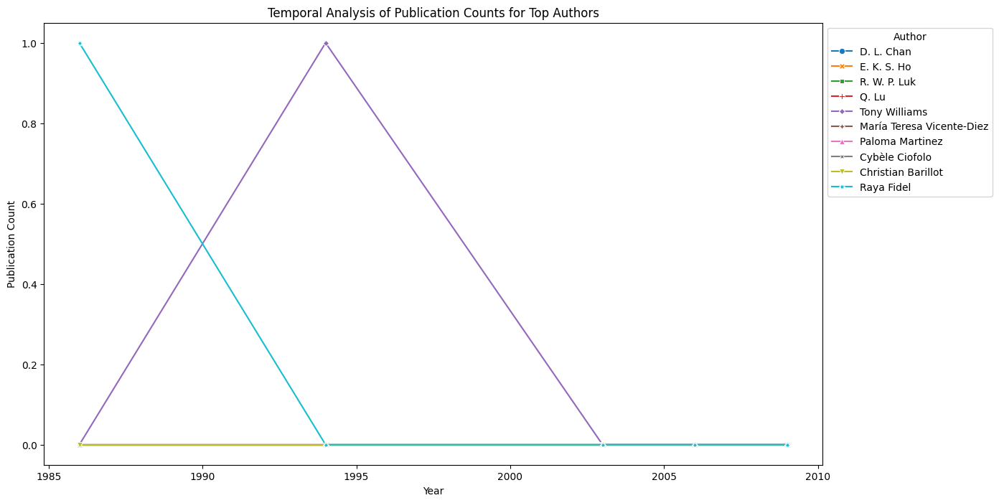

In [103]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'sampled_dat' is your DataFrame containing the provided data
# If not, replace 'sampled_dat' with the actual variable name

# Convert 'Published Year' to numeric (if not already)
sampled_data['Published Year'] = pd.to_numeric(sampled_data['Published Year'], errors='coerce')

# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2, {'year': row['Published Year']}) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# Identify the top N authors with the highest collaboration counts
top_authors = ['D. L. Chan', 'E. K. S. Ho', 'R. W. P. Luk', 'Q. Lu', 'Tony Williams', 'María Teresa Vicente-Diez', 'Paloma Martinez', 'Cybèle Ciofolo', 'Christian Barillot', 'Raya Fidel']

# Extract the publication data for the top authors
top_authors_data = sampled_data[sampled_data['Authors'].apply(lambda authors: any(author in top_authors for author in authors.split(';')))]

# Create a list of years for the temporal analysis
years = sorted(top_authors_data['Published Year'].dropna().astype(int).unique())

# Initialize a DataFrame to store publication counts over time
publication_over_time = pd.DataFrame(index=top_authors, columns=years, dtype=int)

# Fill the publication_over_time DataFrame with publication counts
for year in years:
    year_data = top_authors_data[top_authors_data['Published Year'] == year]
    publication_counts = year_data['Authors'].explode().value_counts()
    publication_over_time[year] = [publication_counts.get(author, 0) for author in top_authors]

# Plot the temporal analysis of publication counts
plt.figure(figsize=(14, 8))
sns.lineplot(data=publication_over_time.T, markers=True, dashes=False)
plt.title('Temporal Analysis of Publication Counts for Top Authors')
plt.xlabel('Year')
plt.ylabel('Publication Count')
plt.legend(title='Author', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

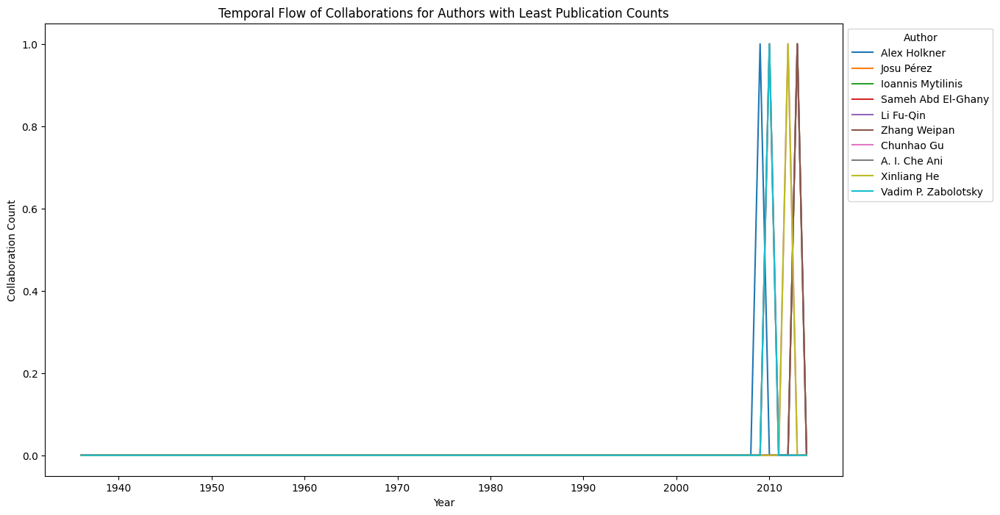

In [131]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'expanded_dat' is your DataFrame containing the provided data
# If not, replace 'expanded_dat' with the actual variable name

# Convert 'Published Year' to numeric (if not already)
expanded_dat['Published Year'] = pd.to_numeric(expanded_dat['Published Year'], errors='coerce')

# Identify authors with the least publication counts
least_publication_authors = expanded_dat['Authors'].value_counts().nsmallest(10).index

# Create a list of years for the temporal analysis
years = sorted(expanded_dat['Published Year'].dropna().astype(int).unique())

# Group by 'Authors' and 'Published Year', then unstack to create a collaboration count matrix
collaboration_over_time_least_publication = expanded_dat.groupby(['Authors', 'Published Year']).size().unstack(fill_value=0)

# Filter the collaboration matrix to include only authors with the least publication counts
collaboration_over_time_least_publication = collaboration_over_time_least_publication.loc[least_publication_authors]

# Plot the temporal flow of collaborations for authors with least publication counts
plt.figure(figsize=(14, 8))
sns.lineplot(data=collaboration_over_time_least_publication.T.reset_index().melt(id_vars='Published Year'),
             x='Published Year', y='value', hue='Authors', markers=True, dashes=False)
plt.title('Temporal Flow of Collaborations for Authors with Least Publication Counts')
plt.xlabel('Year')
plt.ylabel('Collaboration Count')
plt.legend(title='Author', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

In [589]:
import networkx as nx
from networkx.algorithms.community import girvan_newman

# Convert 'Published Year' to numeric (if not already)
sampled_data['Published Year'] = pd.to_numeric(sampled_data['Published Year'], errors='coerce')

# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)

# Perform community detection using the Girvan-Newman algorithm
communities = girvan_newman(G)

# Get the communities at the desired level (you can adjust this based on your network)
level = 2
communities_at_level = tuple(sorted(c) for c in next(communities, []))

# Add community information to the original directed graph as a node attribute
community_membership = {author: idx for idx, community in enumerate(communities_at_level) for author in community}
nx.set_node_attributes(G, community_membership, 'community')

# Print the communities and their members
for idx, community in enumerate(communities_at_level):
    print(f"Community {idx + 1}: {', '.join(community)}")

Community 1: D. L. Chan, E. K. S. Ho, Q. Lu, R. W. P. Luk
Community 2: Tony Williams
Community 3: María Teresa Vicente-Diez, Paloma Martinez
Community 4: Christian Barillot, Cybèle Ciofolo
Community 5: Raya Fidel
Community 6: Chunpeng Ge, Jiandong Wang, Liming Fang, Willy Susilo
Community 7: I. M. Wanless, N. C. Wormald
Community 8: Alexander Khein, C. J. Umrigar, D. J. Singh
Community 9: Dave Clarke, David Costa, Farhad Arbab
Community 10: M. P. Sebastian, V. S. Anitha
Community 11: A. Krzyzak, Ching Y. Suen, Jianxiong Dong
Community 12: Byeong-Ok Lim, Dong-Hoon Shin, Hae-Sung Kim, Jin-Koo Rhee, Seong-Dae Lee, Sung-Chan Kim
Community 13: Guillaume Pierre, Maarten van Steen, Swaminathan Sivasubramanian
Community 14: Leendert van Maanen, Maria E. Niessen, Tjeerd C. Andringa
Community 15: Anastasios Bezerianos, Liviu Vladutu, Seferina Mavroudi, Stergios Papadimitriou
Community 16: Bernd Mahr
Community 17: Divyesh Shah, Sheng Zhong
Community 18: Li Nawen
Community 19: Jiping Lv, Satoshi Y

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/2827270903.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  nx.draw(G, pos=layout, node_color=node_color, cmap=plt.cm.get_cmap("viridis"), with_labels=False, node_size=50)


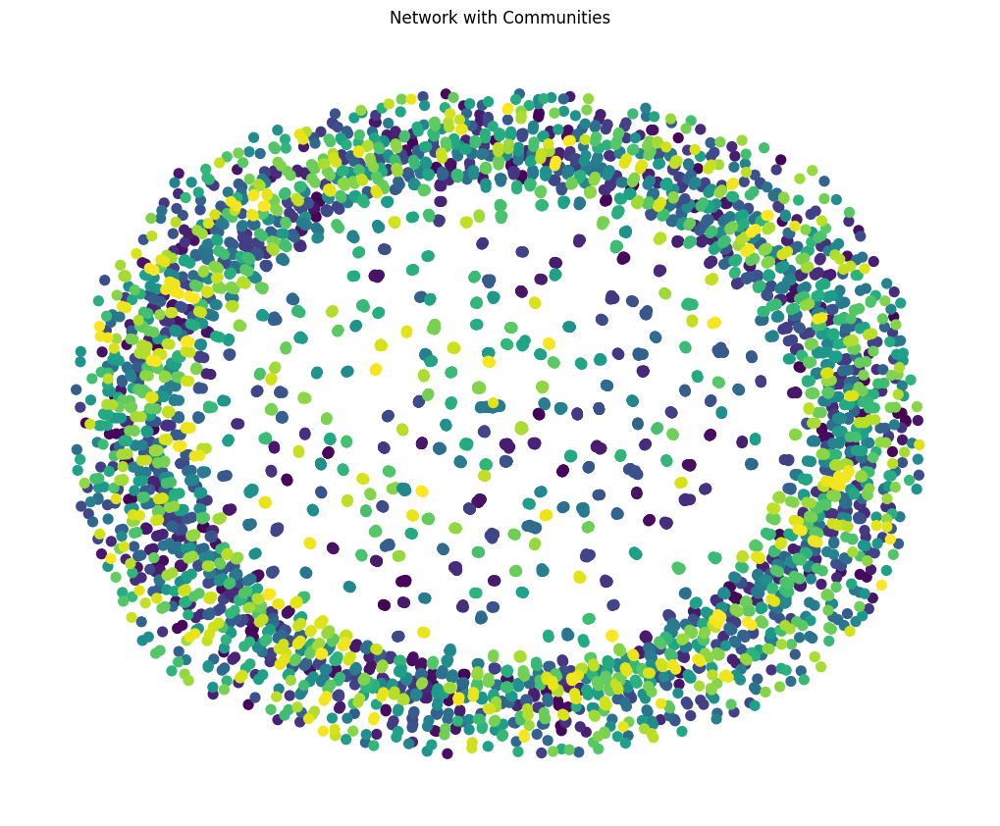

In [221]:
# Create a layout for our nodes 
layout = nx.spring_layout(G)

# Get the community membership of each node
node_color = [community_membership[node] for node in G.nodes]

# Draw the graph with community colors
plt.figure(figsize=(10, 8))
nx.draw(G, pos=layout, node_color=node_color, cmap=plt.cm.get_cmap("viridis"), with_labels=False, node_size=50)
plt.title('Network with Communities')
plt.show()

In [590]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Get the communities at the desired level
level = 2
communities_at_level = tuple(sorted(c) for c in next(communities, []))

community_properties = []

for community in communities_at_level:
    # Calculate properties for each community 
    community_size = len(community)
    
    # Convert the DegreeView to a list and then calculate the sum
    degrees = list(G.degree(community))
    average_degree = sum(dict(degrees).values()) / community_size

    # Append the properties as a tuple
    community_properties.append((community_size, average_degree))


# Standardize the features
scaler = StandardScaler()
community_properties_standardized = scaler.fit_transform(community_properties)

# Apply KMeans clustering
num_clusters = 7  

# Perform KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_assignments = kmeans.fit_predict(community_properties_standardized)

# Add cluster information as a node attribute
cluster_membership = {author: cluster_assignments[idx] for idx, community in enumerate(communities_at_level) for author in community}
nx.set_node_attributes(G, cluster_membership, 'cluster')

# Print the clusters and their members
for cluster_idx in range(n_clusters):
    cluster_members = [author for author, cluster in cluster_membership.items() if cluster == cluster_idx]
    print(f"Cluster {cluster_idx + 1}: {', '.join(cluster_members)}")

Cluster 1: María Teresa Vicente-Diez, Paloma Martinez, Christian Barillot, Cybèle Ciofolo, I. M. Wanless, N. C. Wormald, M. P. Sebastian, V. S. Anitha, Divyesh Shah, Sheng Zhong, Hau-San Wong, Zhiwen Yu, Kamin Whitehouse, Michael Okola, Ofer Shtrichman, Ron Goldring, Hideo Umeki, Masayuki Okamoto, David L. Fulton, Richard T. Thomas, Graham Kendall, Ruibin Bai, A. Bogliolo, M. Damiani, Qiang Lv, Zhanhua Bai, Hitoshi Okada, Takaaki Kamogawa, Paul Grimm, Ralf Dörner, Gábor Horváth, Miklós Telek, Gunnar Tufte, Pauline C. Haddow, Hichem Sahli, Musa Alrefaya, D. K. Palagachev, P. R. Popivanov, A. Rattini, G. Romanin Jacur, Oleg Ushmaev, Vladimir Yu. Gudkov, Ashfaq Khokhar, Turkmen Canli, Charles Sebens, Walt Truszkowski, Chang Zheng, Zhu Guangming, Nancy E. Reed, Paul E. Johnson, Florian A. Potra, Rongqin Sheng, Kesheng Wang, Quan Yu, Bernhard Rumpe, Robert France, Siegfried Handschuh, Steffen Staab, Boyang Li, Mark O. Riedl, Enrique Gerstl, Gur Mosheiov, Andrea G. M. Cilio, Henk Corporaal, 

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [591]:
# Evaluate model performance (you might want to use a different metric depending on your task)
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(community_properties_standardized, cluster_assignments)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.9478065205374674


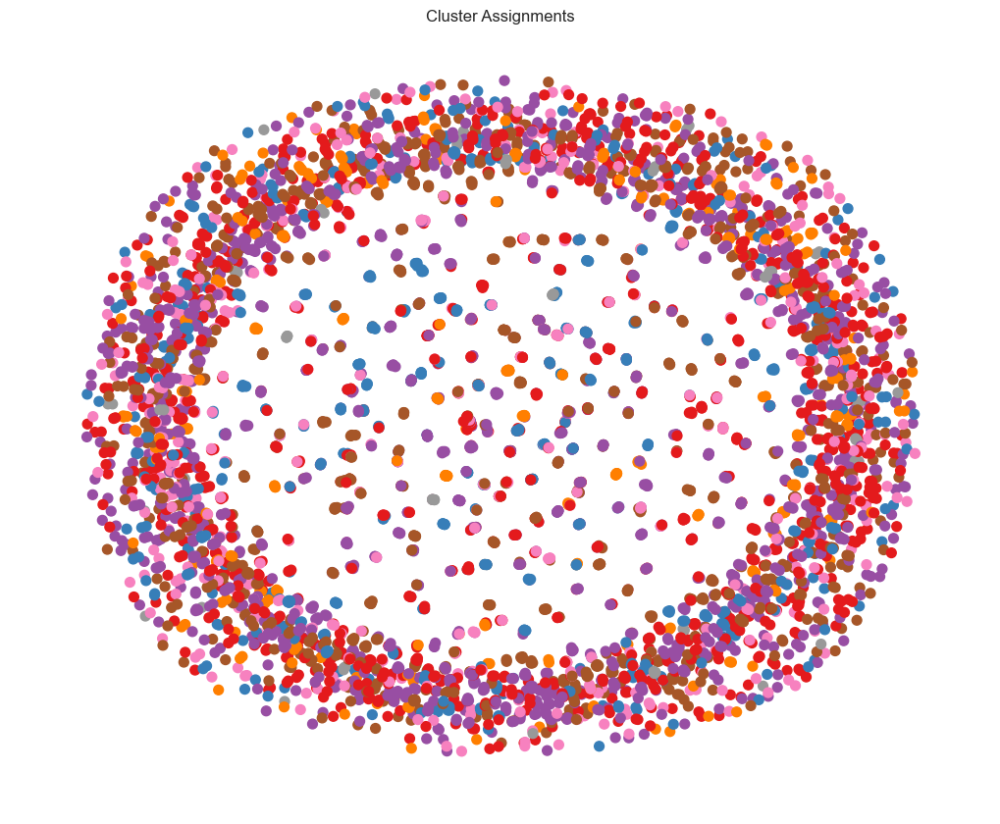

In [592]:
import matplotlib.pyplot as plt
import networkx as nx

# Visualize the cluster assignments
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # You can use other layouts as well
colors = [cluster_assignments[idx] for idx, community in enumerate(communities_at_level) for _ in community]
nx.draw(G, pos, node_color=colors, with_labels=False, cmap=plt.cm.Set1, node_size=50)
plt.title("Cluster Assignments")
plt.show()

In [593]:
# Get the cluster information
cluster_membership = nx.get_node_attributes(G, 'cluster')

In [594]:
# Merge cluster information with original data
original_data_with_clusters = sampled_data.copy()
original_data_with_clusters['Cluster'] = original_data_with_clusters['Authors'].apply(lambda x: cluster_membership.get(x.split(';')[0], -1))

In [595]:
original_data_with_clusters.head(5)

,Unnamed: 0,index,Paper Title,Authors,Published Year,Publication Venue,Collaboration Count,Cluster
1388418,1388418,1388419,A preliminary study on multiple documents acce...,D. L. Chan;E. K. S. Ho;R. W. P. Luk;Q. Lu,2003.0,HSI'03 Proceedings of the 2nd international co...,4,4
170046,170046,170047,Principles of OLE 2.0 (videotape): an expositi...,Tony Williams,1994.0,Principles of OLE 2.0 (videotape): an expositi...,1,5
1316423,1316423,1316424,Temporal Semantics Extraction for Improving We...,María Teresa Vicente-Diez;Paloma Martinez,2009.0,DEXA '09 Proceedings of the 2009 20th Internat...,2,0
1667646,1667646,1667647,Shape analysis and fuzzy control for 3d compet...,Cybèle Ciofolo;Christian Barillot,2006.0,ECCV'06 Proceedings of the 9th European confer...,2,0
4105,4105,4106,The possible effect of abstracting guidelines ...,Raya Fidel,1986.0,Information Processing and Management: an Inte...,1,5


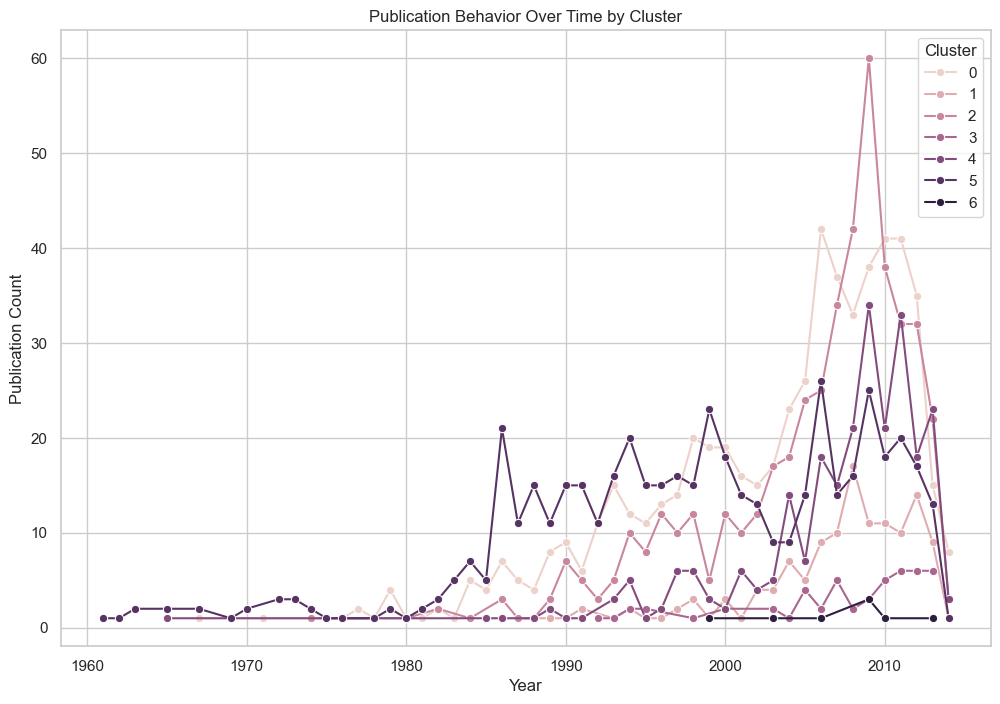

In [596]:
# Group by cluster and publication year
cluster_yearly_stats = original_data_with_clusters.groupby(['Cluster', 'Published Year']).size().reset_index(name='Publication Count')

# Visualize the data 
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.lineplot(data=cluster_yearly_stats, x='Published Year', y='Publication Count', hue='Cluster', marker='o')
plt.title('Publication Behavior Over Time by Cluster')
plt.xlabel('Year')
plt.ylabel('Publication Count')
plt.show()

In [597]:
# Group by cluster, publication year, and count collaborations
collaboration_yearly_stats = original_data_with_clusters.groupby(['Cluster', 'Published Year'])['Authors'].apply(lambda x: sum(len(authors.split(';')) - 1 for authors in x)).reset_index(name='Collaboration Count')

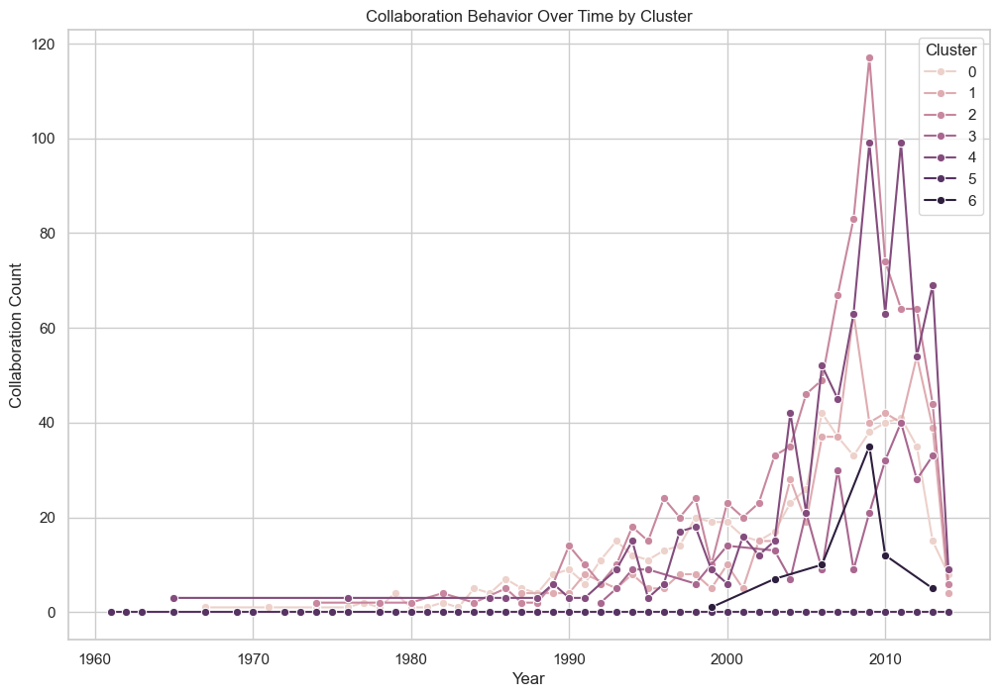

In [598]:
# Visualize collaboration behavior over time
plt.figure(figsize=(12, 8))
sns.lineplot(data=collaboration_yearly_stats, x='Published Year', y='Collaboration Count', hue='Cluster', marker='o')
plt.title('Collaboration Behavior Over Time by Cluster')
plt.xlabel('Year')
plt.ylabel('Collaboration Count')
plt.show()

In [601]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a list to store degree centrality values for each cluster
degree_centrality_data = []

for cluster_idx in range(num_clusters):
    degree_values = list(cluster_centralities[cluster_idx]['Degree Centrality'].values())
    degree_centrality_data.extend([
        {'Cluster': f'Cluster {cluster_idx + 1}', 'Degree Centrality': value}
        for value in degree_values
    ])

# Convert the data to a DataFrame
degree_centrality_df = pd.DataFrame(degree_centrality_data)

# Set the style and create a distribution plot
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

sns.histplot(data=degree_centrality_df, x='Degree Centrality', hue='Cluster', multiple="stack", kde=True)
plt.title('Degree Centrality Distribution Within Clusters')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')

plt.show()

KeyError: 3

In [606]:
import pandas as pd
import networkx as nx

# Assuming you have a DataFrame named 'sampled_data' with columns like 'Authors', 'Published Year', etc.

# Create a list to store individual authors' data
individual_authors_data = []

# Create a graph from the collaboration data
G = nx.Graph()

# Iterate through each row in the sampled data
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    
    # Add nodes and edges based on author collaborations
    G.add_nodes_from(authors)
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i + 1:]]
    G.add_edges_from(edges)

    # Calculate collaboration count, publication count, and tenure for each author
    for author in authors:
        collaboration_count = len(authors) - 1  # excluding the author itself
        publication_count = 1  # assuming each row corresponds to one publication
        tenure_of_research = max(row['Published Year'] - sampled_data[sampled_data['Authors'].str.contains(author)]['Published Year'].min(), 0)
        
        # Calculate degree centrality for each author
        degree_centrality = nx.degree_centrality(G)[author]
        
        # Append data for the current author to the list
        individual_authors_data.append({
            'Author': author,
            'Collaboration Count': collaboration_count,
            'Publication Count': publication_count,
            'Tenure of Research': tenure_of_research,
            'Degree Centrality': degree_centrality
        })

# Create a new DataFrame from the list of individual authors' data
individual_authors_df = pd.DataFrame(individual_authors_data)

# Display the new dataset
print(individual_authors_df.head())

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/3846998021.py:25: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



          Author  Collaboration Count  Publication Count  Tenure of Research  \
0     D. L. Chan                    3                  1                 0.0   
1    E. K. S. Ho                    3                  1                 0.0   
2   R. W. P. Luk                    3                  1                 0.0   
3          Q. Lu                    3                  1                 0.0   
4  Tony Williams                    0                  1                 0.0   

   Degree Centrality  
0                1.0  
1                1.0  
2                1.0  
3                1.0  
4                0.0  


In [386]:
individual_authors_df

,Author,Collaboration Count,Publication Count,Tenure of Research,Degree Centrality
0,D. L. Chan,3,1,0.0,1.000000
1,E. K. S. Ho,3,1,0.0,1.000000
2,R. W. P. Luk,3,1,0.0,1.000000
3,Q. Lu,3,1,0.0,1.000000
4,Tony Williams,0,1,0.0,0.000000
...,...,...,...,...,...
5144,Brian A. Weiss,2,1,0.0,0.000394
5145,Raj Madhavan,2,1,0.0,0.000394
5146,"Nathaniel J. Davis, IV",2,1,0.0,0.000393
5147,William Tsun-Yuk Hsu,2,1,0.0,0.000393


In [607]:
# Assuming you have the cluster information in the cluster_membership dictionary

# Create a new column 'Cluster' in individual_authors_df and initialize it with NaN
individual_authors_df['Cluster'] = np.nan

# Assign the cluster information to the corresponding authors in individual_authors_df
for cluster_idx in range(n_clusters):
    cluster_members = [author for author, cluster in cluster_membership.items() if cluster == cluster_idx]
    individual_authors_df.loc[individual_authors_df['Author'].isin(cluster_members), 'Cluster'] = cluster_idx

# Display the updated individual_authors_df with the 'Cluster' column
print(individual_authors_df)

                      Author  Collaboration Count  Publication Count  \
0                 D. L. Chan                    3                  1   
1                E. K. S. Ho                    3                  1   
2               R. W. P. Luk                    3                  1   
3                      Q. Lu                    3                  1   
4              Tony Williams                    0                  1   
...                      ...                  ...                ...   
5144          Brian A. Weiss                    2                  1   
5145            Raj Madhavan                    2                  1   
5146  Nathaniel J. Davis, IV                    2                  1   
5147    William Tsun-Yuk Hsu                    2                  1   
5148       Howard Jay Siegel                    2                  1   

      Tenure of Research  Degree Centrality  Cluster  
0                    0.0           1.000000      NaN  
1                    0.0 

In [608]:
individual_authors_df

,Author,Collaboration Count,Publication Count,Tenure of Research,Degree Centrality,Cluster
0,D. L. Chan,3,1,0.0,1.000000,NaN
1,E. K. S. Ho,3,1,0.0,1.000000,NaN
2,R. W. P. Luk,3,1,0.0,1.000000,NaN
3,Q. Lu,3,1,0.0,1.000000,NaN
4,Tony Williams,0,1,0.0,0.000000,NaN
...,...,...,...,...,...,...
5144,Brian A. Weiss,2,1,0.0,0.000394,2.0
5145,Raj Madhavan,2,1,0.0,0.000394,2.0
5146,"Nathaniel J. Davis, IV",2,1,0.0,0.000393,2.0
5147,William Tsun-Yuk Hsu,2,1,0.0,0.000393,2.0


In [609]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Step 1: Define the target variable (labels)
# You may need to adjust this threshold based on your specific criteria
threshold_years_ecr = 5
individual_authors_df['Label'] = np.where(individual_authors_df['Tenure of Research'] <= threshold_years_ecr, 'ECR', 'ER')

# Step 2: Feature Selection
features = ['Collaboration Count', 'Publication Count', 'Tenure of Research', 'Degree Centrality']

from sklearn.impute import SimpleImputer

# Replace NaN values with mean
imputer = SimpleImputer(strategy='mean')
individual_authors_df[features] = imputer.fit_transform(individual_authors_df[features])


# Step 3: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    individual_authors_df[features],
    individual_authors_df['Label'],
    test_size=0.2,
    random_state=42
)

# Step 4: Model Training
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 5: Model Evaluation
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Model Accuracy: {accuracy}')

# Step 6: Predict Labels
individual_authors_df['Predicted Label'] = clf.predict(individual_authors_df[features])

# Step 7: Analyze Results
ecr_distribution = individual_authors_df.groupby(['Cluster', 'Predicted Label']).size().unstack(fill_value=0)
print(ecr_distribution)

Model Accuracy: 1.0
Predicted Label   ECR  ER
Cluster                  
0.0              1167   1
1.0               642   2
2.0              1393   5


In [408]:
from sklearn.metrics import classification_report

# Assuming y_true and y_pred are your true and predicted labels
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         ECR       1.00      1.00      1.00      1028
          ER       1.00      1.00      1.00         2

    accuracy                           1.00      1030
   macro avg       1.00      1.00      1.00      1030
weighted avg       1.00      1.00      1.00      1030



In [409]:
individual_authors_df

,Author,Collaboration Count,Publication Count,Tenure of Research,Degree Centrality,Cluster,Label,Predicted Label
0,D. L. Chan,3.0,1.0,0.0,1.000000,2.0,ECR,ECR
1,E. K. S. Ho,3.0,1.0,0.0,1.000000,2.0,ECR,ECR
2,R. W. P. Luk,3.0,1.0,0.0,1.000000,2.0,ECR,ECR
3,Q. Lu,3.0,1.0,0.0,1.000000,2.0,ECR,ECR
4,Tony Williams,0.0,1.0,0.0,0.000000,0.0,ECR,ECR
...,...,...,...,...,...,...,...,...
5144,Brian A. Weiss,2.0,1.0,0.0,0.000394,2.0,ECR,ECR
5145,Raj Madhavan,2.0,1.0,0.0,0.000394,2.0,ECR,ECR
5146,"Nathaniel J. Davis, IV",2.0,1.0,0.0,0.000393,2.0,ECR,ECR
5147,William Tsun-Yuk Hsu,2.0,1.0,0.0,0.000393,2.0,ECR,ECR


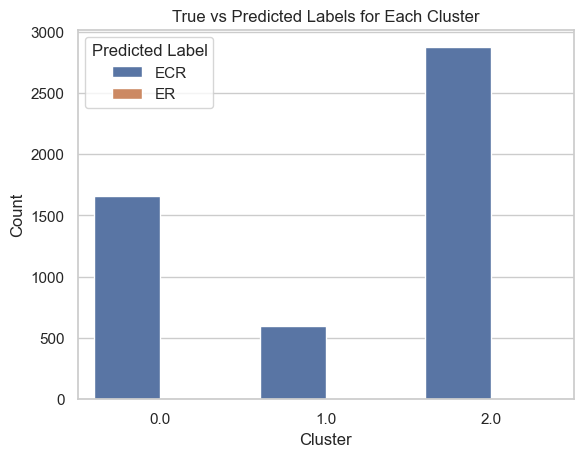

In [411]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y_true and y_pred are your true and predicted labels
sns.countplot(x='Cluster', hue='Predicted Label', data=individual_authors_df)
plt.title('True vs Predicted Labels for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()

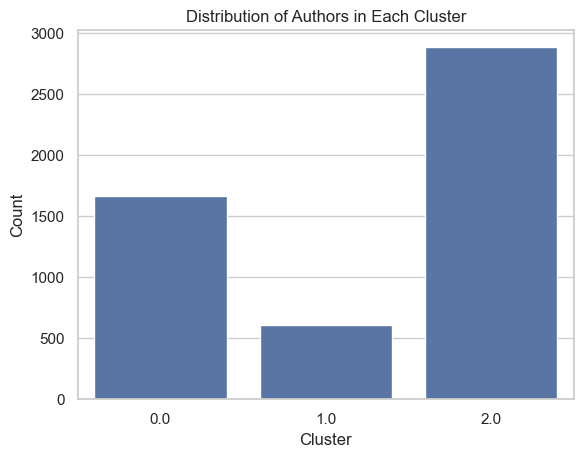

In [414]:
sns.countplot(x='Cluster', data=individual_authors_df)
plt.title('Distribution of Authors in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()

In [415]:
# Assuming individual_authors_df contains a 'Category' column with values 'ECR' and 'ER'
ecr_nodes = individual_authors_df[individual_authors_df['Predicted Label'] == 'ECR']['Author'].tolist()
er_nodes = individual_authors_df[individual_authors_df['Predicted Label'] == 'ER']['Author'].tolist()

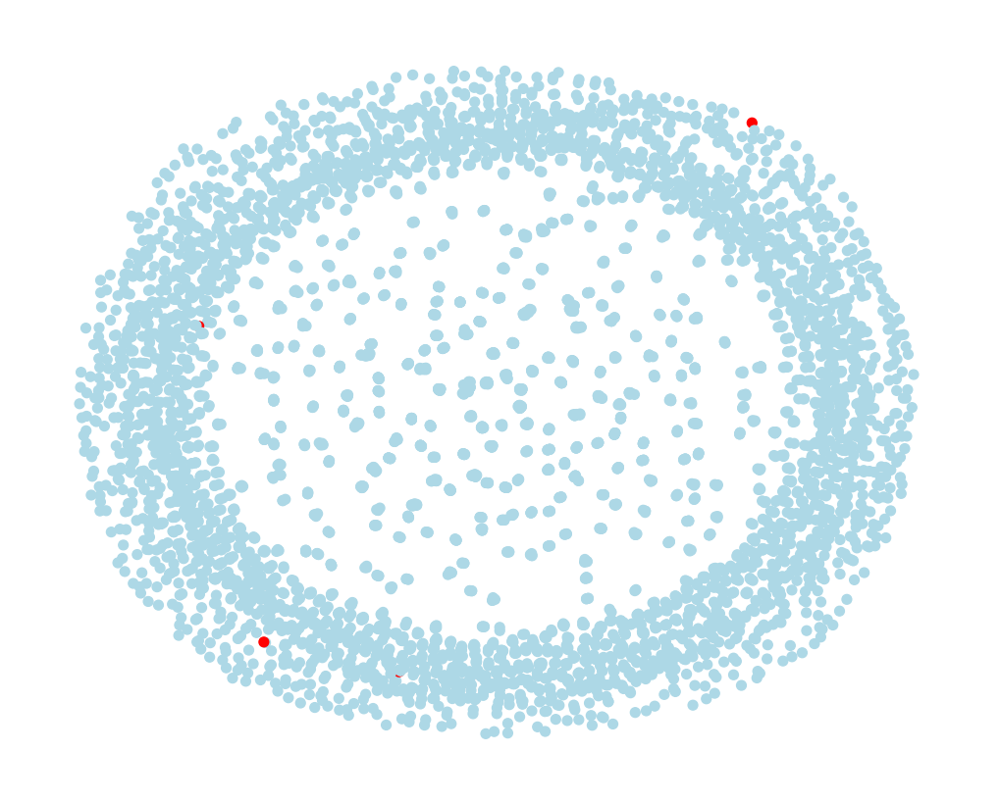

In [419]:
# Create a mapping of node colors based on category
node_colors = {node: 'lightblue' if node in ecr_nodes else 'red' if node in er_nodes else 'gray' for node in G.nodes}

# Draw the network with node colors
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # You can use a different layout algorithm
nx.draw(G, pos, node_color=[node_colors[node] for node in G.nodes], with_labels=False, node_size=50)
plt.show()

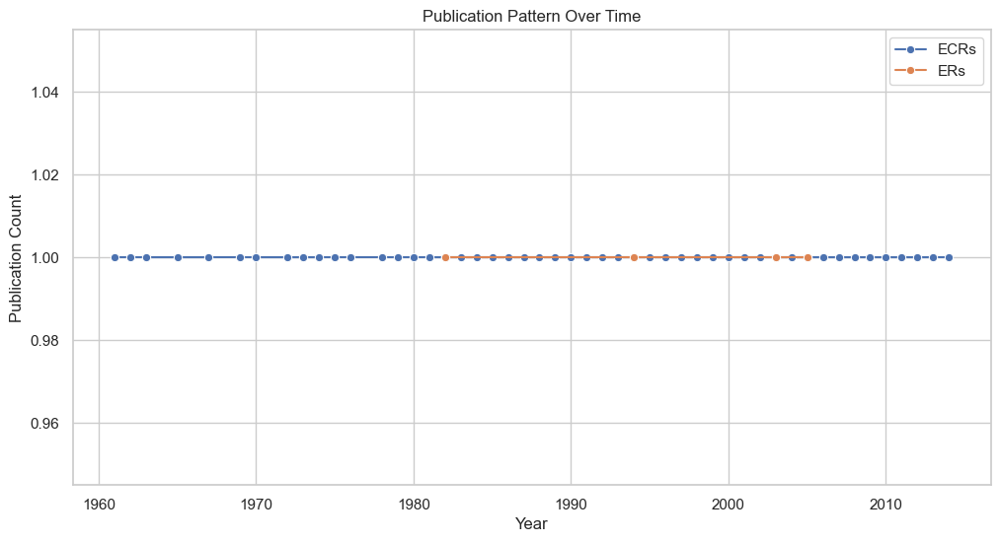

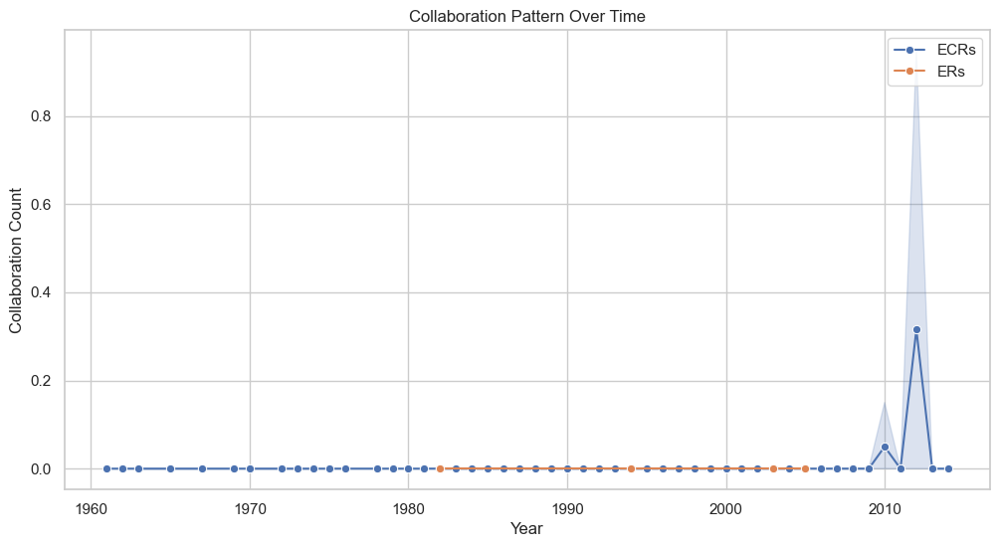

In [423]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming individual_authors_df contains columns: 'Author', 'Category', 'Collaboration Count', 'Publication Count'

# Merge individual_authors_df with sampled_data to get 'Published Year'
merged_data = individual_authors_df.merge(sampled_data[['Authors', 'Published Year']], left_on='Author', right_on='Authors', how='left')

# Filter data for ECRs and ERs
ecr_data = merged_data[merged_data['Predicted Label'] == 'ECR']
er_data = merged_data[merged_data['Predicted Label'] == 'ER']

# Plotting publication pattern
plt.figure(figsize=(12, 6))

sns.lineplot(data=ecr_data, x='Published Year', y='Publication Count', label='ECRs', marker='o')
sns.lineplot(data=er_data, x='Published Year', y='Publication Count', label='ERs', marker='o')

plt.title('Publication Pattern Over Time')
plt.xlabel('Year')
plt.ylabel('Publication Count')
plt.legend()
plt.show()

# Plotting collaboration pattern
plt.figure(figsize=(12, 6))

sns.lineplot(data=ecr_data, x='Published Year', y='Collaboration Count', label='ECRs', marker='o')
sns.lineplot(data=er_data, x='Published Year', y='Collaboration Count', label='ERs', marker='o')

plt.title('Collaboration Pattern Over Time')
plt.xlabel('Year')
plt.ylabel('Collaboration Count')
plt.legend()
plt.show()

In [611]:
import spacy
import pandas as pd

# Load spaCy English language model
nlp = spacy.load("en_core_web_sm")

# Assuming 'Paper Title' is the column with paper titles
titles = original_data_with_clusters['Paper Title']

# Tokenize, remove stop words, and convert to lowercase
tokenized_titles = []
for title in titles:
    doc = nlp(title)
    tokens = [token.text.lower() for token in doc if token.is_alpha and not token.is_stop]
    tokenized_titles.append(tokens)

# Create a dictionary and corpus
dictionary = corpora.Dictionary(tokenized_titles)
corpus = [dictionary.doc2bow(title) for title in tokenized_titles]

# Train LDA model
lda_model = models.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

# Analyze topics
topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

# Assign topics to documents
original_data_with_clusters['Topic'] = [max(lda_model[doc], key=lambda x: x[1])[0] for doc in corpus]

(0, '0.011*"data" + 0.009*"based" + 0.007*"control" + 0.007*"design" + 0.006*"systems"')
(1, '0.009*"object" + 0.009*"based" + 0.008*"oriented" + 0.006*"system" + 0.006*"learning"')
(2, '0.014*"based" + 0.008*"analysis" + 0.006*"problem" + 0.005*"algorithm" + 0.005*"information"')
(3, '0.017*"based" + 0.012*"systems" + 0.011*"system" + 0.010*"model" + 0.008*"management"')
(4, '0.008*"networks" + 0.008*"approach" + 0.007*"time" + 0.007*"based" + 0.006*"algorithm"')


In [612]:
topic_mapping = {
    0: 'Machine Learning',
    1: 'Software Systems',
    2: 'Data Analysis',
    3: 'Programming and Networks',
    4: 'Control Systems and Fuzzy Logic'
}
# Add a 'Topic Name' column based on the mapping
original_data_with_clusters['Topic Name'] = original_data_with_clusters['Topic'].map(topic_mapping)


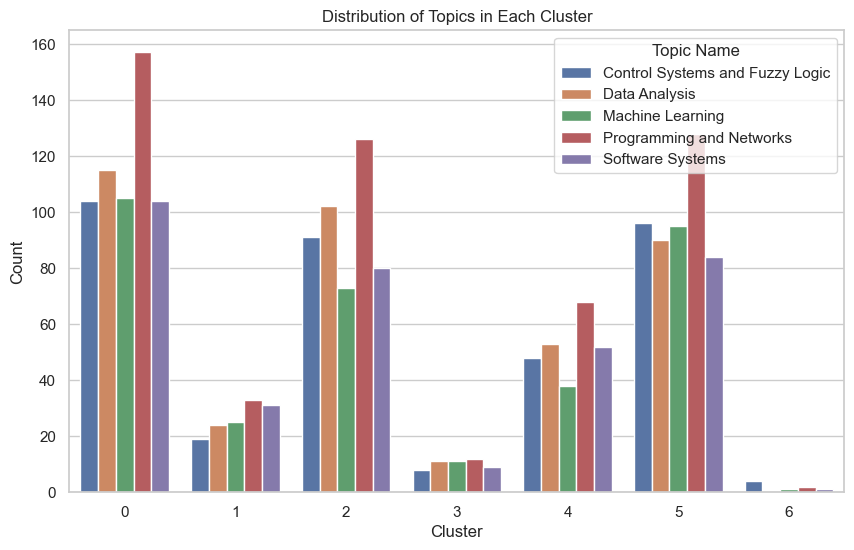

In [613]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Cluster', hue='Topic Name', data=original_data_with_clusters)
plt.title('Distribution of Topics in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Topic Name')
plt.show()

In [614]:
original_data_with_clusters

,Unnamed: 0,index,Paper Title,Authors,Published Year,Publication Venue,Collaboration Count,Cluster,Topic,Topic Name
1388418,1388418,1388419,A preliminary study on multiple documents acce...,D. L. Chan;E. K. S. Ho;R. W. P. Luk;Q. Lu,2003.0,HSI'03 Proceedings of the 2nd international co...,4,4,0,Machine Learning
170046,170046,170047,Principles of OLE 2.0 (videotape): an expositi...,Tony Williams,1994.0,Principles of OLE 2.0 (videotape): an expositi...,1,5,4,Control Systems and Fuzzy Logic
1316423,1316423,1316424,Temporal Semantics Extraction for Improving We...,María Teresa Vicente-Diez;Paloma Martinez,2009.0,DEXA '09 Proceedings of the 2009 20th Internat...,2,0,4,Control Systems and Fuzzy Logic
1667646,1667646,1667647,Shape analysis and fuzzy control for 3d compet...,Cybèle Ciofolo;Christian Barillot,2006.0,ECCV'06 Proceedings of the 9th European confer...,2,0,2,Data Analysis
4105,4105,4106,The possible effect of abstracting guidelines ...,Raya Fidel,1986.0,Information Processing and Management: an Inte...,1,5,4,Control Systems and Fuzzy Logic
...,...,...,...,...,...,...,...,...,...,...
378100,378100,378101,An interactive graphic presentation for multio...,Russell K. Anderson;Moshe Dror,2001.0,Applied Mathematics and Computation,2,0,1,Software Systems
89089,89089,89090,Porting PUNDIT to the resource management domain,Lynette Hirschman;Francois-Michel Lang;John Do...,1989.0,HLT '89 Proceedings of the workshop on Speech ...,4,4,3,Programming and Networks
276014,276014,276015,Simulation of fast packet-switched photonic ne...,K. A. Aly;P. W. Dowd,1991.0,ANSS '91 Proceedings of the 24th annual sympos...,2,0,4,Control Systems and Fuzzy Logic
1903618,1903618,1903619,Co-X panel discussion,Elena Messina;Brian A. Weiss;Raj Madhavan,2010.0,Proceedings of the 10th Performance Metrics fo...,3,2,0,Machine Learning


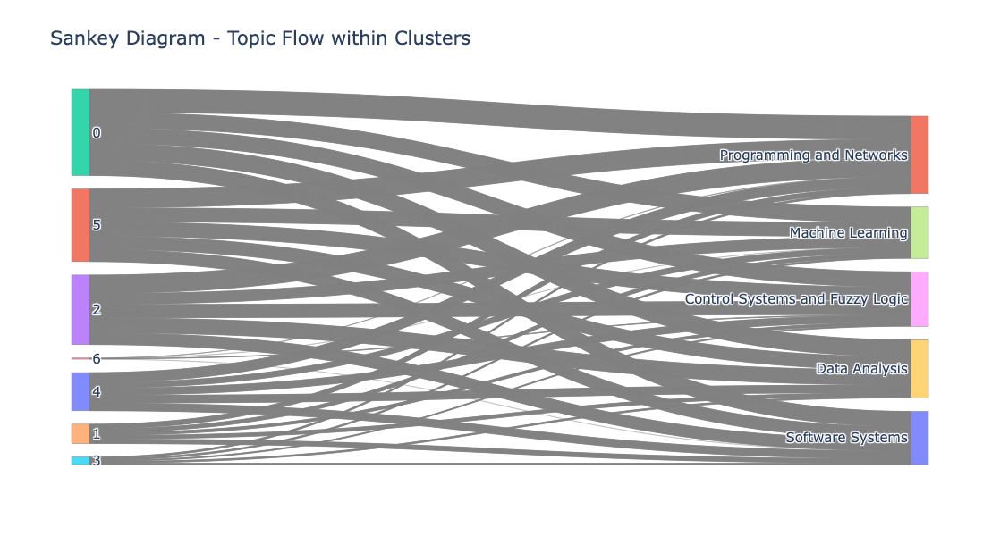

In [615]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have a DataFrame 'original_data_with_clusters' with columns 'Cluster' and 'Topic Name'
# Extract relevant columns
sankey_data = original_data_with_clusters[['Cluster', 'Topic Name']]

# Create a list of unique clusters and topics
clusters = sankey_data['Cluster'].unique()
topics = sankey_data['Topic Name'].unique()

# Create a Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color='grey', width=0.5),
        label=clusters.tolist() + topics.tolist()
    ),
    link=dict(
        source=sankey_data['Cluster'].apply(lambda x: clusters.tolist().index(x)),
        target=sankey_data['Topic Name'].apply(lambda x: len(clusters) + topics.tolist().index(x)),
        value=[1] * len(sankey_data),  # Corrected value property to accept a list
        color="rgba(128, 128, 128, 0.3)",
        
    )
)])

# Update layout
fig.update_layout(title_text="Sankey Diagram - Topic Flow within Clusters",
                  width=1000,  # Adjust width
                height=600,  # Adjust height
                  font_size=15)

# Show the plot
fig.show()

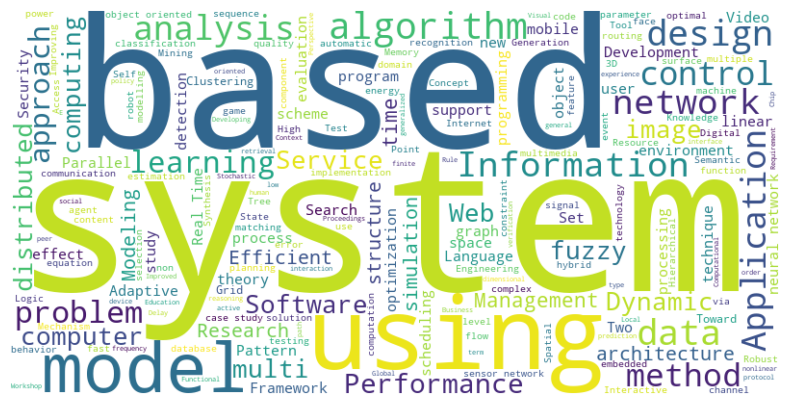

In [479]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming 'Paper Title' and 'Topic' are the relevant columns in your DataFrame
titles_and_topics = original_data_with_clusters[['Paper Title', 'Topic Name']].dropna()

# Combine all paper titles into a single string
text = ' '.join(titles_and_topics['Paper Title'])

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Display the WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [515]:
individual_authors_df.to_csv("Author_data.csv", index=False)

In [579]:
import networkx as nx
import plotly.graph_objects as go
import pandas as pd



# Create a graph from the collaboration data
G = nx.Graph()

# Add nodes and edges based on author collaborations
for index, row in sampled_data.iterrows():
    authors = row['Authors'].split(';')
    G.add_nodes_from(authors)
    edges = [(author1, author2) for i, author1 in enumerate(authors) for author2 in authors[i+1:]]
    G.add_edges_from(edges)


# Calculate degree centrality for each node
degree_centrality = nx.degree_centrality(G)
# Initialize empty lists to store individual authors and publication years
all_authors = []
all_years = []

# Iterate through rows in the DataFrame
for _, row in sampled_data.iterrows():
    # Split the authors in the current row
    authors = row['Authors'].split(';')
    
    # Repeat the publication year for each author and extend the lists
    all_years.extend([row['Published Year']] * len(authors))
    all_authors.extend(authors)

# Create a new DataFrame with individual authors and their publication years
authors_df = pd.DataFrame({
    'Author': all_authors,
    'Published Year': all_years,
})

# Identify the author with the highest publication count for each year
highest_pub_authors = authors_df.groupby('Published Year')['Author'].apply(lambda x: max(x, key=all_authors.count)).reset_index()

# Create scatter plot trace for nodes
node_trace = go.Scatter(
    x=[pos[author][0] for author in highest_pub_authors['Author']],
    y=[pos[author][1] for author in highest_pub_authors['Author']],
    mode='markers',
    marker=dict(
        size=[degree_centrality.get(author, 1) * 100 for author in highest_pub_authors['Author']],
        color='rgba(152, 0, 0, 0.6)',
        line=dict(width=0.5, color='rgb(0, 0, 0)'),
    ),
    text=list(highest_pub_authors['Author']),
)

# Create line chart trace for publication distribution over time
line_trace = go.Scatter(
    x=highest_pub_authors['Published Year'],
    y=highest_pub_authors.groupby('Published Year').size(),
    mode='lines+markers',
    name='Publication Distribution',
)
# Create layout
layout = go.Layout(
    showlegend=True,
    hovermode='closest',
    title='Author Connectivity and Highest Publication Count Over Time',
    xaxis=dict(
        showgrid=False,
        zeroline=False,
        showticklabels=True,
        range=[min(sampled_data['Published Year']), max(sampled_data['Published Year'])],  # Set x-axis range
    ),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=True),
)

# Create figure
fig = go.Figure(data=[node_trace, line_trace], layout=layout)

# Save the figure as a static HTML file
fig.write_html("static_plot.html")

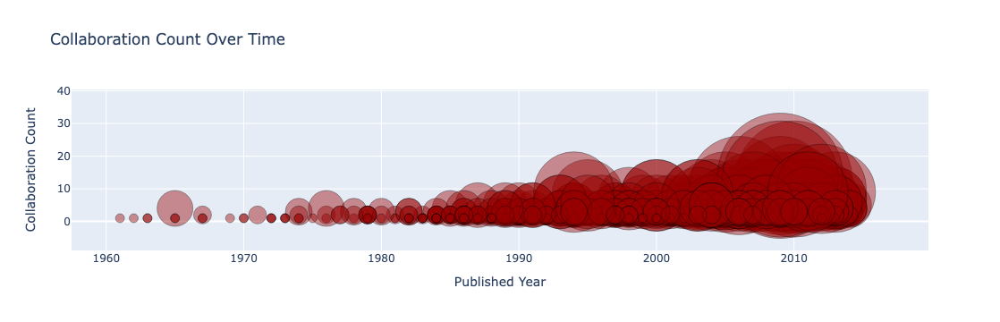

In [588]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming 'Authors' column contains a list of authors separated by commas
sampled_data['Collaboration Count'] = sampled_data['Authors'].apply(lambda x: len(x.split(';')))

# Create a scatter plot for collaboration count
fig = go.Figure()

scatter_trace = go.Scatter(
    x=sampled_data['Published Year'],
    y=sampled_data['Collaboration Count'],
    mode='markers',
    marker=dict(
        size=sampled_data['Collaboration Count'] * 10,
        color='rgba(152, 0, 0, 0.6)',
        line=dict(width=0.5, color='rgb(0, 0, 0)'),
    ),
    text=sampled_data['Authors'],
    name='Collaboration Count',
)

fig.add_trace(scatter_trace)

# Update layout
fig.update_layout(
    title='Collaboration Count Over Time',
    xaxis=dict(title='Published Year'),
    yaxis=dict(title='Collaboration Count'),
)

# Show the figure
fig.show()

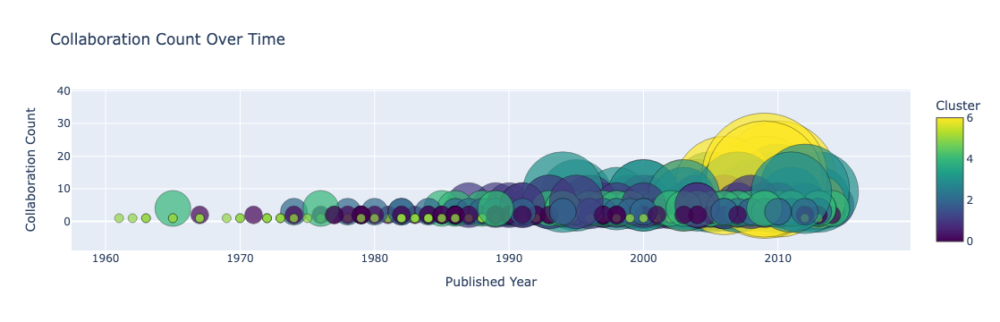

In [616]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a scatter plot for collaboration count
fig = go.Figure()

scatter_trace = go.Scatter(
    x=original_data_with_clusters['Published Year'],
    y=original_data_with_clusters['Collaboration Count'],
    mode='markers',
    marker=dict(
        size=original_data_with_clusters['Collaboration Count'] * 10,
        color=original_data_with_clusters['Cluster'],  # Assuming 'Cluster' is the column with cluster information
        colorscale='Viridis',  # You can choose a different colorscale
        line=dict(width=0.5, color='rgb(0, 0, 0)'),
        colorbar=dict(title='Cluster'),
    ),
    text=original_data_with_clusters['Authors'],
    name='Collaboration Count',
)

fig.add_trace(scatter_trace)

# Update layout
fig.update_layout(
    title='Collaboration Count Over Time',
    xaxis=dict(title='Published Year'),
    yaxis=dict(title='Collaboration Count'),
)

# Show the figure
fig.show()

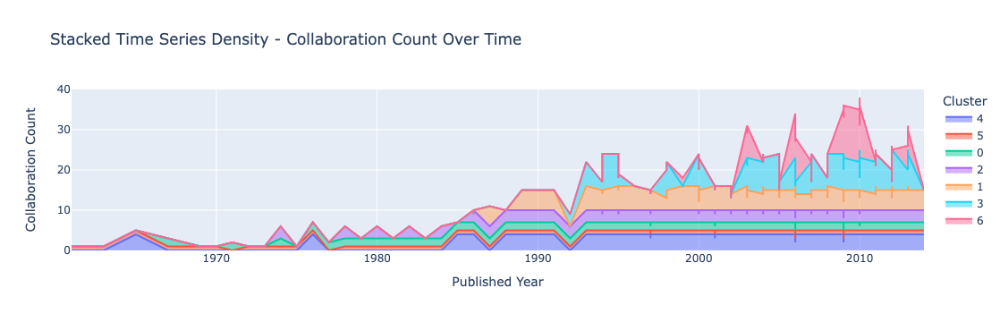

In [622]:
import plotly.express as px

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a stacked time series density plot
fig = px.area(
    original_data_with_clusters,
    x='Published Year',
    y='Collaboration Count',
    color='Cluster',  # Assuming 'Cluster' is the column with cluster information
    labels={'Collaboration Count': 'Collaboration Count'},
    title='Stacked Time Series Density - Collaboration Count Over Time',
)

# Show the figure
fig.show()

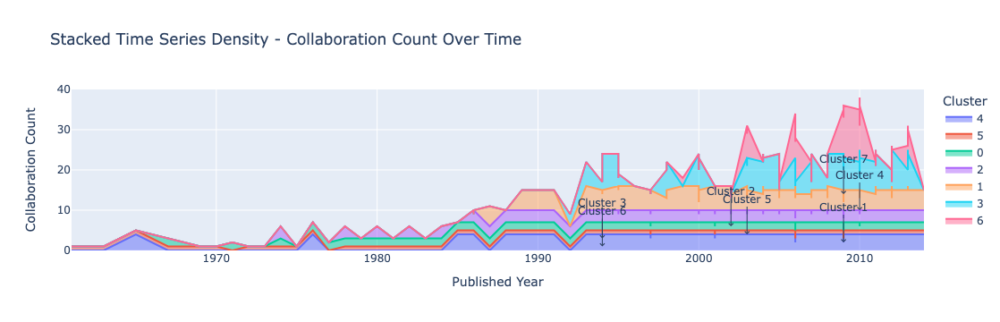

In [630]:
import plotly.express as px

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a stacked time series density plot
fig = px.area(
    original_data_with_clusters,
    x='Published Year',
    y='Collaboration Count',
    color='Cluster',  # Assuming 'Cluster' is the column with cluster information
    labels={'Collaboration Count': 'Collaboration Count'},
    title='Stacked Time Series Density - Collaboration Count Over Time',
)

# Identify peaks for each cluster
peaks = original_data_with_clusters.groupby('Cluster')['Collaboration Count'].idxmax()

# Add nodes at the yearly peaks
for i, peak_index in enumerate(peaks):
    peak_year = original_data_with_clusters.loc[peak_index, 'Published Year']
    peak_count = original_data_with_clusters.loc[peak_index, 'Collaboration Count']
    
    fig.add_annotation(
        go.layout.Annotation(
            x=peak_year,
            y=peak_count,
            xref='x',
            yref='y',
            text=f'Cluster {i + 1}',
            showarrow=True,
            arrowhead=4,
            ax=0,
            ay=-40,
        )
    )

# Show the figure
fig.show()

In [642]:
plt.rcParams['text.usetex'] = False

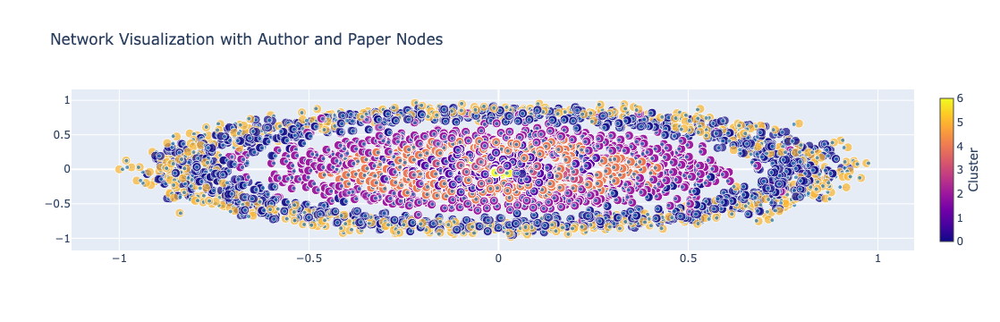

In [651]:
import pandas as pd
import plotly.graph_objects as go
import networkx as nx

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a network graph
G = nx.Graph()

# Add nodes for authors and papers
for _, row in original_data_with_clusters.iterrows():
    for author in row['Authors'].split(';'):
        G.add_node(author, cluster=row['Cluster'])
    paper_node = f"Paper: {row['Paper Title']}"
    G.add_node(paper_node, cluster=None)
    # Connect authors to the paper with edge weight as collaboration count
    for author in row['Authors'].split(';'):
        G.add_edge(author, paper_node, weight=row['Collaboration Count'])

# Get positions of nodes using Fruchterman-Reingold force-directed layout
pos = nx.spring_layout(G)

# Create edge traces
edge_x = []
edge_y = []
edge_hover_text = []  # Added a list to store hover text
for edge in G.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_hover_text.append(f"Common Author Count: {edge[2]['weight']}")  # Store hover text

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='text',  # Set hoverinfo to 'text'
    text=edge_hover_text,  # Set text for hover
    mode='lines')

# Create node traces
node_x = []
node_y = []
text = []
marker_size = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    text.append(node.split(':')[-1] if 'Paper' in node else node)
    if 'Paper' in node:
        marker_size.append(5)  # Set smaller size for paper nodes
    else:
        marker_size.append(10)  # Set larger size for author nodes

node_trace = go.Scatter(
    x=node_x, y=node_y,
    text=text,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        size=marker_size,  # Use marker_size list to set size for each node
        colorbar=dict(
            thickness=15,
            title='Cluster',
            xanchor='left',
            titleside='right'
        )
    )
)

# Add edge weights as hover text
edge_trace['hovertext'] = [f"Common Author Count: {edge[2]['weight']}" for edge in G.edges(data=True)]

# Add node colors based on clusters
node_trace['marker']['color'] = [
    G.nodes[node]['cluster'] if 'cluster' in G.nodes[node] and G.nodes[node]['cluster'] is not None else '#1f77b4'
    for node in G.nodes
]
node_trace['marker']['colorbar']['ticktext'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))
node_trace['marker']['colorbar']['tickvals'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))

# Create figure
fig = go.Figure()

# Add edge and node traces to the figure
fig.add_trace(edge_trace)
fig.add_trace(node_trace)

# Update layout
fig.update_layout(
    showlegend=False,
    hovermode='closest',
    title='Network Visualization with Author and Paper Nodes',
)

# Show the figure
fig.show()

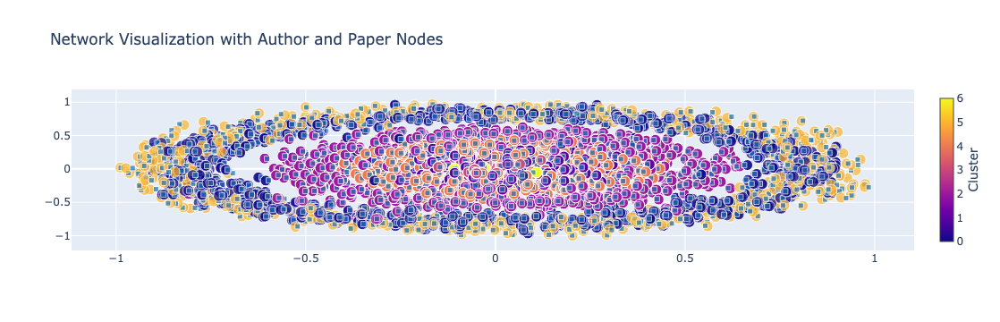

In [653]:
import pandas as pd
import plotly.graph_objects as go
import networkx as nx

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a network graph
G = nx.Graph()

# Add nodes for authors and papers
for _, row in original_data_with_clusters.iterrows():
    for author in row['Authors'].split(';'):
        G.add_node(author, cluster=row['Cluster'])
    paper_node = f"Paper: {row['Paper Title']}"
    G.add_node(paper_node, cluster=None)
    # Connect authors to the paper with edge weight as collaboration count
    for author in row['Authors'].split(';'):
        G.add_edge(author, paper_node, weight=row['Collaboration Count'])

# Get positions of nodes using Fruchterman-Reingold force-directed layout
pos = nx.spring_layout(G)

# Create edge traces
edge_x = []
edge_y = []
edge_hover_text = []  # Added a list to store hover text
for edge in G.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_hover_text.append(f"Common Author Count: {edge[2]['weight']}")  # Store hover text

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='text',  # Set hoverinfo to 'text'
    text=edge_hover_text,  # Set text for hover
    mode='lines')

# Create node traces
node_x = []
node_y = []
text = []
marker_size = []
marker_symbol = []  # Added a list to store marker symbol
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    text.append(node.split(':')[-1] if 'Paper' in node else node)
    if 'Paper' in node:
        marker_size.append(6)  # Set size for paper nodes
        marker_symbol.append('square')  # Set marker symbol for paper nodes
    else:
        marker_size.append(12)  # Set size for author nodes
        marker_symbol.append('circle')  # Set marker symbol for author nodes

node_trace = go.Scatter(
    x=node_x, y=node_y,
    text=text,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        size=marker_size,  # Use marker_size list to set size for each node
        symbol=marker_symbol,  # Use marker_symbol list to set symbol for each node
        colorbar=dict(
            thickness=15,
            title='Cluster',
            xanchor='left',
            titleside='right'
        )
    )
)

# Add edge weights as hover text
edge_trace['hovertext'] = [f"Common Author Count: {edge[2]['weight']}" for edge in G.edges(data=True)]

# Add node colors based on clusters
node_trace['marker']['color'] = [
    G.nodes[node]['cluster'] if 'cluster' in G.nodes[node] and G.nodes[node]['cluster'] is not None else '#1f77b4'
    for node in G.nodes
]
node_trace['marker']['colorbar']['ticktext'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))
node_trace['marker']['colorbar']['tickvals'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))

# Create figure
fig = go.Figure()

# Add edge and node traces to the figure
fig.add_trace(edge_trace)
fig.add_trace(node_trace)

# Update layout
fig.update_layout(
    showlegend=False,
    hovermode='closest',
    title='Network Visualization with Author and Paper Nodes',
)

# Show the figure
fig.show()

# Save the figure as a static HTML file
fig.write_html("Network-plot.html")

/var/folders/x8/4cj2npzd4z59sbfbgzc6lg140000gn/T/ipykernel_35751/3707490395.py:19: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared.



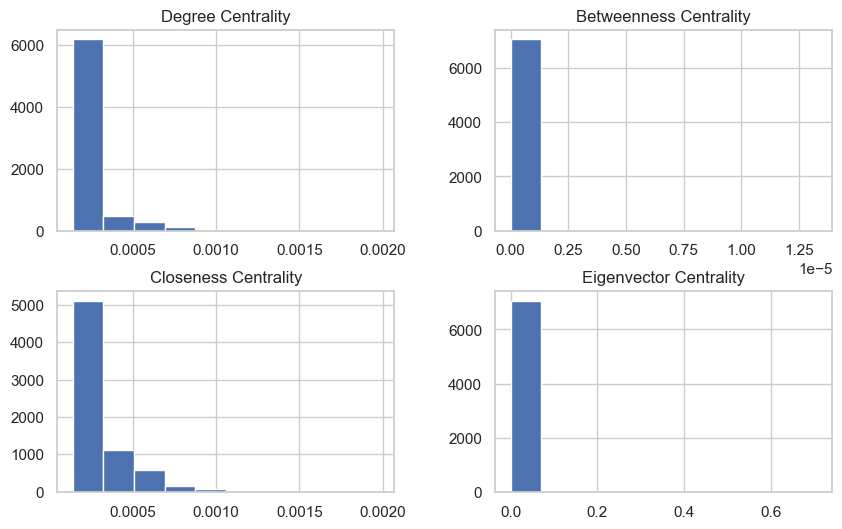

In [673]:
import matplotlib.pyplot as plt

# Calculate centralities
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=500)

# Create a DataFrame for centralities
centrality_data = pd.DataFrame({
    'Degree Centrality': list(degree_centrality.values()),
    'Betweenness Centrality': list(betweenness_centrality.values()),
    'Closeness Centrality': list(closeness_centrality.values()),
    'Eigenvector Centrality': list(eigenvector_centrality.values())
})

# Create box plots
fig, ax = plt.subplots(figsize=(10, 6))
centrality_data.(ax=ax)
ax.set_ylabel('Centrality Value')
ax.set_title('Distribution of Centralities')

plt.show()

In [661]:
centrality_data.describe()

,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality
count,7085.000000,7.085000e+03,7085.000000,7.085000e+03
mean,0.000205,5.071214e-08,0.000317,5.037389e-04
std,0.000150,2.834424e-07,0.000173,1.187053e-02
min,0.000141,0.000000e+00,0.000141,4.081446e-45
25%,0.000141,0.000000e+00,0.000188,1.277293e-35
50%,0.000141,0.000000e+00,0.000282,2.271899e-29
75%,0.000141,0.000000e+00,0.000392,1.226175e-24
max,0.001976,1.329322e-05,0.001976,7.063739e-01


In [667]:
variance_degree = np.var(centrality_data['Degree Centrality'])
variance_degree

2.2539712410025316e-08

In [669]:
variance_betweeness = np.var(centrality_data['Betweenness Centrality'])
variance_betweeness

8.032823678256664e-14

In [671]:
variance_close = np.var(centrality_data['Closeness Centrality'])
variance_close

3.001133052354854e-08

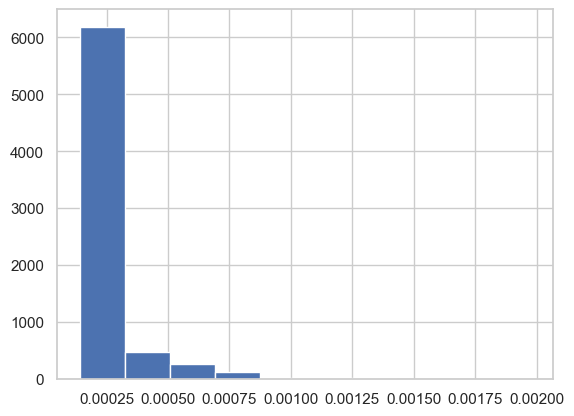

In [672]:
plt.hist(centrality_data['Degree Centrality'])
plt.show()

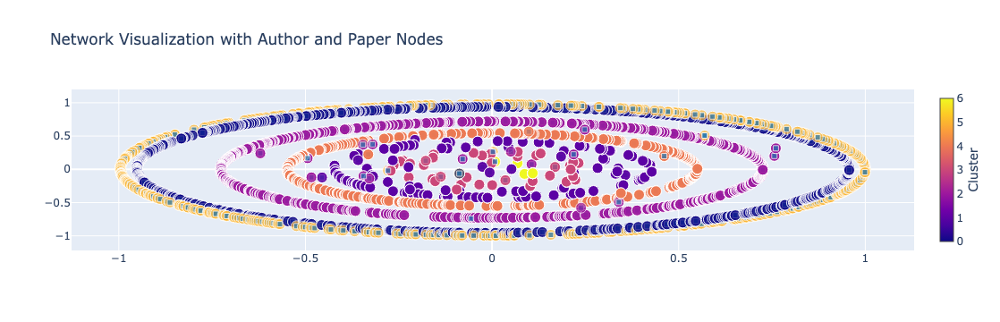

In [676]:
import pandas as pd
import plotly.graph_objects as go
import networkx as nx

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a network graph
G = nx.Graph()

# Add nodes for authors and papers
for _, row in original_data_with_clusters.iterrows():
    for author in row['Authors'].split(';'):
        G.add_node(author, cluster=row['Cluster'])
        # Connect authors to the paper with edge weight as collaboration count
        G.add_edge(author, f"Paper: {row['Paper Title']}", weight=row['Collaboration Count'])

# Get positions of nodes using Fruchterman-Reingold force-directed layout
pos = nx.kamada_kawai_layout(G)

# Create edge traces
edge_x = []
edge_y = []
edge_hover_text = []  # Added a list to store hover text
for edge in G.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_hover_text.append(f"Common Author Count: {edge[2]['weight']}")  # Store hover text

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='text',  # Set hoverinfo to 'text'
    text=edge_hover_text,  # Set text for hover
    mode='lines')

# Create node traces
node_x = []
node_y = []
text = []
marker_size = []
marker_symbol = []  # Added a list to store marker symbol
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    text.append(node.split(':')[-1] if 'Paper' in node else node)
    if 'Paper' in node:
        marker_size.append(6)  # Set size for paper nodes
        marker_symbol.append('square')  # Set marker symbol for paper nodes
    else:
        marker_size.append(12)  # Set size for author nodes
        marker_symbol.append('circle')  # Set marker symbol for author nodes

node_trace = go.Scatter(
    x=node_x, y=node_y,
    text=text,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        size=marker_size,  # Use marker_size list to set size for each node
        symbol=marker_symbol,  # Use marker_symbol list to set symbol for each node
        colorbar=dict(
            thickness=15,
            title='Cluster',
            xanchor='left',
            titleside='right'
        )
    )
)

# Add edge weights as hover text
edge_trace['hovertext'] = [f"Common Author Count: {edge[2]['weight']}" for edge in G.edges(data=True)]

# Add node colors based on clusters
node_trace['marker']['color'] = [
    G.nodes[node]['cluster'] if 'cluster' in G.nodes[node] and G.nodes[node]['cluster'] is not None else '#1f77b4'
    for node in G.nodes
]
node_trace['marker']['colorbar']['ticktext'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))
node_trace['marker']['colorbar']['tickvals'] = list(set([G.nodes[node]['cluster'] for node in G.nodes if 'cluster' in G.nodes[node]]))

# Create figure
fig = go.Figure()

# Add edge and node traces to the figure
fig.add_trace(edge_trace)
fig.add_trace(node_trace)

# Update layout
fig.update_layout(
    showlegend=False,
    hovermode='closest',
    title='Network Visualization with Author and Paper Nodes',
)

# Show the figure
fig.show()

# Save the figure as a static HTML file
fig.write_html("Network-plot.html")

In [681]:
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, BoxZoomTool, ResetTool, PanTool, WheelZoomTool, PointDrawTool, Button
from bokeh.models.graphs import GraphRenderer, NodesAndLinkedEdges
from bokeh.layouts import column
from bokeh.palettes import Spectral
import networkx as nx

# Assuming 'Authors' column contains a list of authors separated by commas
original_data_with_clusters['Collaboration Count'] = original_data_with_clusters['Authors'].apply(lambda x: len(x.split(';')))

# Create a network graph
G = nx.Graph()

# Add nodes for authors and papers
for _, row in original_data_with_clusters.iterrows():
    for author in row['Authors'].split(';'):
        G.add_node(author, cluster=row['Cluster'])
    paper_node = f"Paper: {row['Paper Title']}"
    G.add_node(paper_node, cluster=None)
    # Connect authors to the paper with edge weight as collaboration count
    for author in row['Authors'].split(';'):
        G.add_edge(author, paper_node, weight=row['Collaboration Count'])

# Create Bokeh plot
plot = figure(title="Collaboration Network Visualization", x_range=(-1.1, 1.1), y_range=(-1.1, 1.1),
              tools="pan,wheel_zoom,box_zoom,reset", active_scroll="wheel_zoom")

# Color mapping for clusters
cluster_colors = {cluster: color for cluster, color in zip(
    sorted(set(cluster for cluster in nx.get_node_attributes(G, 'cluster').values() if cluster is not None)),
    Spectral[len(set(cluster for cluster in nx.get_node_attributes(G, 'cluster').values() if cluster is not None))]
)}

# Create a Bokeh plot
plot = figure(title="Collaboration Network Visualization", x_range=(-1.1, 1.1), y_range=(-1.1, 1.1),
              tools="pan,wheel_zoom,box_zoom,reset", active_scroll="wheel_zoom")

# Convert networkx graph to a Bokeh graph
graph_renderer = GraphRenderer()

# Add nodes and edges to the Bokeh graph
graph_renderer.node_renderer.data_source.add(list(G.nodes()), 'index')
graph_renderer.node_renderer.glyph = Circle(size=10, fill_color={'field': 'cluster', 'transform': ColorMapper(palette=Spectral[10])})

graph_renderer.edge_renderer.data_source.data = dict(
    start=[start for start, _ in G.edges()],
    end=[end for _, end in G.edges()]
)

# Configure node and edge visuals
graph_renderer.node_renderer.glyph.size = 10
graph_renderer.node_renderer.data_source.data['color'] = [cluster_colors[G.nodes[node]['cluster']] if 'cluster' in G.nodes[node] and G.nodes[node]['cluster'] is not None else 'gray' for node in G.nodes]
graph_renderer.edge_renderer.glyph.line_alpha = 0.6

# Add interactive tools
plot.add_tools(HoverTool(tooltips=[("Node", "@index")]), BoxZoomTool(), ResetTool(), PanTool(), WheelZoomTool())

# Update the layout on button click
def update():
    graph_renderer.layout_provider.randomize()
    graph_renderer.edge_renderer.glyph.line_alpha = np.random.rand()

# Button for layout update
button = Button(label="Update Layout")
button.on_click(lambda event: update())

# Set up layout
layout = column(plot, button)

# Show the plot
show(layout)

ImportError: cannot import name 'GraphRenderer' from 'bokeh.models.graphs' (/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/bokeh/models/graphs.py)